# <u>**_Identifying and Analysing Obesity types using Advanced Machine Learning_**<U>

In [1]:
import pandas as pd
import numpy as  np
import matplotlib.pyplot as plt
import seaborn as sns

### **<u>___Objective___<u>**
- To build machine learning models that are accurately able to classify obesity types by understanding the feature distributions and applying advanced data preprocessing models. Build and optimize machine learning model to derive informational insights.

### **Import Data**

In [2]:
data=pd.read_csv('obesity_train.csv')
data=data.drop('id',axis=1)

In [3]:
data_org=pd.read_csv('Obesity_original_DataSet.csv')
data_org['NObeyesdad_en']=data_org['NObeyesdad'].replace({'Overweight_Level_II':3, 'Normal_Weight':1, 'Insufficient_Weight':0,
       'Obesity_Type_III':6, 'Obesity_Type_II':5, 'Overweight_Level_I':2,
       'Obesity_Type_I':4})   

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          20758 non-null  object 
 1   Age                             20758 non-null  float64
 2   Height                          20758 non-null  float64
 3   Weight                          20758 non-null  float64
 4   family_history_with_overweight  20758 non-null  object 
 5   FAVC                            20758 non-null  object 
 6   FCVC                            20758 non-null  float64
 7   NCP                             20758 non-null  float64
 8   CAEC                            20758 non-null  object 
 9   SMOKE                           20758 non-null  object 
 10  CH2O                            20758 non-null  float64
 11  SCC                             20758 non-null  object 
 12  FAF                             

**Note:** *The dataset has 15 features*

In [5]:
data.isnull().any().any()

False

In [6]:
if data.isnull().any().any()==False:
    print('No null values in the dataset')
else:
    print('Null values present')
# no null values

No null values in the dataset


In [7]:
data.duplicated().any()
if data.duplicated().any()==False:
    print('No duplicate rows in the dataset')
else:
    print('Duplicate rows present')

No duplicate rows in the dataset


- change the column names for better understanding (use the data for reference)
- The problem in hand could be treated as an ordinal regression problem to indicate the possibility of an onset or possibility of any of the other categories.
- The problem alternatively can be treated as a direct classificaton model as well.

In [8]:
b = [
    'Gender',
    'Age',
    'Height',
    'Weight',
    'Family History with Overweight',
    'Frequency of Consumption of High Caloric Food',
    'Frequency of Consumption of Vegetables',
    'Number of Main Meals',
    'Consumption of Food between Meals',
    'Smoking Habit',
    'Consumption of Water Daily',
    'Calories Consumption Monitoring',
    'Physical Activity Frequency',
    'Time Using Technology Devices',
    'Consumption of Alcohol',
    'Mode of Transportation',
    'Obese or Not (Target Variable)'
]

data_1=pd.DataFrame(data.values,columns=b)
data_1

,Gender,Age,Height,Weight,Family History with Overweight,Frequency of Consumption of High Caloric Food,Frequency of Consumption of Vegetables,Number of Main Meals,Consumption of Food between Meals,Smoking Habit,Consumption of Water Daily,Calories Consumption Monitoring,Physical Activity Frequency,Time Using Technology Devices,Consumption of Alcohol,Mode of Transportation,Obese or Not (Target Variable)
0,Male,24.443011,1.699998,81.66995,yes,yes,2.0,2.983297,Sometimes,no,2.763573,no,0.0,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,Female,18.0,1.56,57.0,yes,yes,2.0,3.0,Frequently,no,2.0,no,1.0,1.0,no,Automobile,Normal_Weight
2,Female,18.0,1.71146,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,Female,20.952737,1.71073,131.274851,yes,yes,3.0,3.0,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20753,Male,25.137087,1.766626,114.187096,yes,yes,2.919584,3.0,Sometimes,no,2.151809,no,1.330519,0.19668,Sometimes,Public_Transportation,Obesity_Type_II
20754,Male,18.0,1.71,50.0,no,yes,3.0,4.0,Frequently,no,1.0,no,2.0,1.0,Sometimes,Public_Transportation,Insufficient_Weight
20755,Male,20.101026,1.819557,105.580491,yes,yes,2.407817,3.0,Sometimes,no,2.0,no,1.15804,1.198439,no,Public_Transportation,Obesity_Type_II
20756,Male,33.852953,1.7,83.520113,yes,yes,2.671238,1.971472,Sometimes,no,2.144838,no,0.0,0.973834,no,Automobile,Overweight_Level_II


In [9]:
data_1.describe().drop('count',axis=0)

,Gender,Age,Height,Weight,Family History with Overweight,Frequency of Consumption of High Caloric Food,Frequency of Consumption of Vegetables,Number of Main Meals,Consumption of Food between Meals,Smoking Habit,Consumption of Water Daily,Calories Consumption Monitoring,Physical Activity Frequency,Time Using Technology Devices,Consumption of Alcohol,Mode of Transportation,Obese or Not (Target Variable)
unique,2,1703.0,1833.0,1979.0,2,2,934.0,689.0,4,2,1506.0,2,1360.0,1297.0,3,5,7
top,Female,18.0,1.7,80.0,yes,yes,3.0,3.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Obesity_Type_III
freq,10422,1916.0,1334.0,866.0,17014,18982,7658.0,14706.0,17529,20513,6616.0,20071,5044.0,6566.0,15066,16687,4046


### <u>**Demographic Insights: Health and Lifestyle Behaviors in the Dataset**<u>
- **Non-smokers:** Approximately 98.8% of the individuals in this dataset are non-smokers.
- **Alcohol Consumption:** About 72.57% of the individuals consume alcohol sometimes.
- **Public Transport Usage:** Around 80.3% of the individuals use public transport.
- **Calorie Monitoring:** Approximately 96.6% of the individuals do not monitor their calorie consumption.

**BMI (Body Mass Index)** is a well-known standard indicator of body health, widely used for an initial assessment based on a person's weight and height.
BMIs can be further categorized into specific bodily conditions such as underweight, normal weight, overweight, and obesity.
However, health cannot be directly assessed by a unidirectional factor such as BMI alone. Other attributes like dietary habits, physical activity, and lifestyle contribute to an individual's overall health, providing a more comprehensive view.

- *Calculate BMI:*
    - **Formula:** BMI = weight (kg) / (height (m))^2
    - Calculate the BMI for each individual in the given dataset.<br><br>

- *Classify Based on BMI:*
  - Classify each individual into standard categories based on BMI:
      - Underweight
      - Normal weight
      - Overweight
      - Obese<br><br>

- *Model Building:*
    - Calculate accuracy to evaluate how well BMI-based predictions match the actual classes assigned in the dependent variable.
    - Compute other metrics such as precision, recall, and F1-score for a more comprehensive evaluation.<br><br>

- *Analyze the Importance of Other Features:*
    - Use machine learning models (e.g., Random Forest) to determine feature importance.
    - Identify which additional features significantly impact obesity.<br><br>

- *Summarize and Report Findings:*
    - Highlight the discrepancies between BMI-based predictions and actual classes.
    - Provide insights into the role of other features in influencing obesity.
    - Offer recommendations based on the analysis.<br><br>

- *Visualizations:*
    - Create visualizations to support the analysis (e.g., scatter plots, feature importance charts).


In [12]:
data['BMI']=data['Weight']/(data['Height'])**2

In [13]:
data['BMI'].describe()

count    20758.000000
mean        30.241842
std          8.333932
min         12.868541
25%         24.088223
50%         29.384757
75%         37.011168
max         54.997991
Name: BMI, dtype: float64

### <u>**BMI Analysis and Categorization<u>**

- **BMI Range:**
  - The lowest BMI in the dataset is 12.87, while the highest is 55.
  - The majority of the dataset is centralized around a BMI of 30.24, suggesting that the dataset mainly represents individuals who are classified as overweight or obese.
  - This specific data is relevant for understanding outcomes, interventions, and behaviors pertaining to individuals with higher BMI.
  - Further exploratory data analysis (EDA) can help explore this inference.


<u>*Formulating a new column based on binning the calculated BMIs*<u>

In [14]:

data['BMI_bin']=pd.cut(data['BMI'],bins=[(data['BMI'].min()-1),18.5,25,30,35,40,45,(data['BMI'].max()+1)],
                       labels=['Insufficient_Weight','Normal_Weight', 'Overweight_Level_I','Overweight_Level_II',
                              'Obesity_Type_I','Obesity_Type_II','Obesity_Type_III'])

*Understanding the agreement between assigned class labels in the dataset and class labels solely based on just BMI*

In [15]:

from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,cohen_kappa_score,classification_report
BMI_relevance=pd.DataFrame({'Metrics':[],'Metric_values':[]})
BMI_relevance['Metrics']=['Accuracy_score','cohen_kappa_score']
metric_value=[]
nobeyesdad_encoded=data['NObeyesdad'].replace({ 'Insufficient_Weight':0, 'Normal_Weight':1,
                                                                  'Overweight_Level_I':2,'Overweight_Level_II':3,'Obesity_Type_I':4,'Obesity_Type_II':5,
                                                                  'Obesity_Type_III':6})
bmi_encoded=data['BMI_bin'].replace({ 'Insufficient_Weight':0, 'Normal_Weight':1,
                                                                  'Overweight_Level_I':2,'Overweight_Level_II':3,'Obesity_Type_I':4,'Obesity_Type_II':5,
                                                                  'Obesity_Type_III':6})
metric_value.append(accuracy_score(data['NObeyesdad'],data['BMI_bin']))
metric_value.append(cohen_kappa_score(nobeyesdad_encoded,bmi_encoded,weights='quadratic'))
BMI_relevance['Metric_values']=metric_value
print(classification_report(data['NObeyesdad'],data['BMI_bin']))

                     precision    recall  f1-score   support

Insufficient_Weight       0.92      0.88      0.90      2523
      Normal_Weight       0.78      0.89      0.83      3082
     Obesity_Type_I       0.06      0.08      0.07      2910
    Obesity_Type_II       0.03      0.03      0.03      3248
   Obesity_Type_III       0.98      0.07      0.13      4046
 Overweight_Level_I       0.41      0.81      0.55      2427
Overweight_Level_II       0.08      0.09      0.08      2522

           accuracy                           0.37     20758
          macro avg       0.46      0.41      0.37     20758
       weighted avg       0.49      0.37      0.35     20758



In [16]:
BMI_relevance

,Metrics,Metric_values
0,Accuracy_score,0.373157
1,cohen_kappa_score,0.872570


*Anyalyzing the amount of variance in nobeyesdad explained by BMI*

In [17]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score	
nobeyesdad_df=pd.DataFrame(nobeyesdad_encoded.values,columns=['nobeyesdad'])
bmi_df=pd.DataFrame(bmi_encoded.values,columns=['bmi'])
model=LinearRegression()
model.fit(bmi_df,nobeyesdad_df)
print('The amount of variance in nobesdad explained by BMI is -',np.round(r2_score(model.predict(bmi_df),nobeyesdad_df)*100,2),'%')

The amount of variance in nobesdad explained by BMI is - 90.35 %



*To understand the influence of BMI alone as a sole factor in predicting the class labels of Nobeyesdad.*

### <u>**Key Insights:**</u>
About 90.35% of the variance in the target variable is explained by BMI alone.
The low accuracy score of 37% in comparison to the high R² score could be misleading, thus it is recommended to observe recall and F1 scores to make valid inferences.

### <u>Specific Class Observations:</u>

 ___**Low Recall Despite Sufficient Support:**___
-In scenarios where recall is low despite sufficient support, it suggests that a significant proportion of instances from the particular class do not align with the standard BMI-based criteria of classification.

 ____**Classes with Low Recall:**___
- Obesity_Type_1
- Obesity_Type_11
- Obesity_Type_111
- OverWeight_Level_11

These classes are significantly represented in the dataset but have very low recall in the context of our objective. This defines a grey area that relies on other features to make accurate predictions.

 ___**High Recall in Certain Classes:**___
-Normal Weight: Has the highest recall of 89% with acceptable support of 2408, indicating that this class can mostly be defined by just height and weight.

-Insufficient Weight: Has a recall of 88%.

-Overweight_Level_1: Has a recall of 81%.

___**Additional Analysis:**___
-Based on the quadratic behavior of height in comparison to weight in BMI, a change in height has a more dominant effect over BMI compared to a change in weight.

-Although BMI is a strong indicator of body health, the dataset captures influences from other features, making it more reliable in correctly identifying the health status of an individual.

___**Cohen Kappa Score:**___
-The Cohen kappa score is a more reliable indicator when comparing two variables to appropriately assess their agreement with each other beyond just random chance.

-This is particularly important in situations where the distribution of classes is uneven or when the number of unique classes is large.

-Given the closeness of different BMI values which could be categorized into multiple classes, the Cohen kappa score penalizes misclassifications differently based on the severity of the error when the weight is specified as quadratic. This can provide more nuanced insights into the performance of the classification system.

-Encoding them according to their ordinal significance makes the assumptions more meaningful and reliable.

### <u>Cohen Kappa Score Analysis:</u>
-A Cohen kappa score of 0.872 indicates excellent agreement between the dataset target values and BMI-based classification values.

-The lower recalls of specific classes indicate the importance of other features in correctly characterizing the data points in a multidimensional space.
characterizing the data points in a multidimensional space.
acterizing the data points in a multidimensional space.


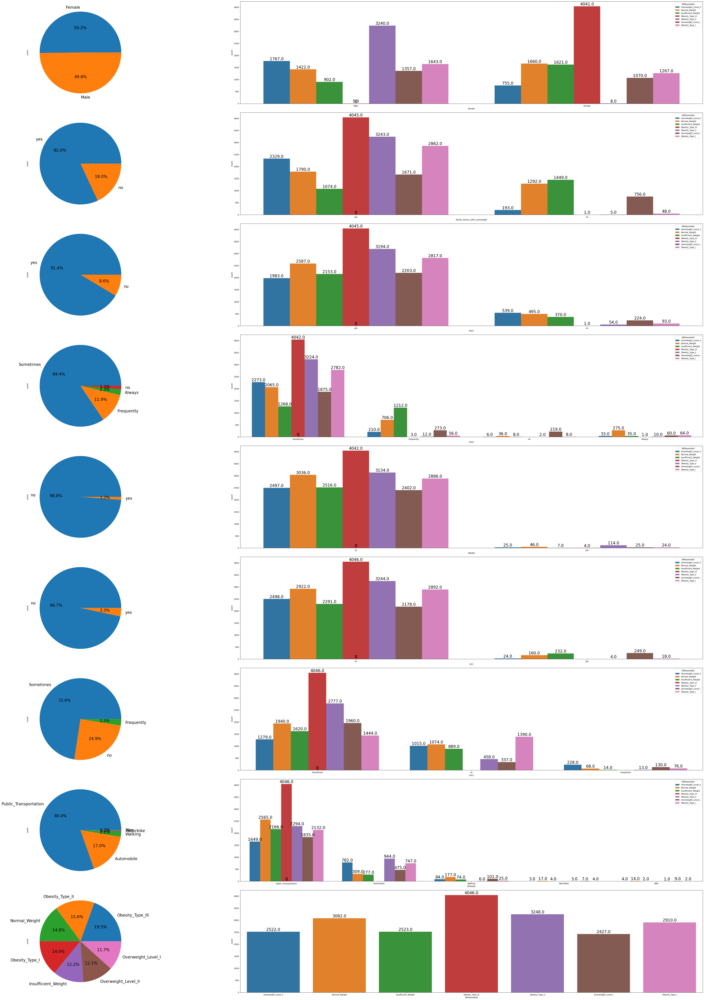

In [19]:
# CATEGORICAL VARIABLE VISUALIZATIONS
# PIE PLOT AND COUNTPLOTS

import warnings
warnings.filterwarnings('ignore')

fig,axes=plt.subplots(nrows=len(data.select_dtypes(include='object').columns),ncols=2,figsize=(60,70))
for i,feature in enumerate(data.select_dtypes(include='object').columns):
    data[feature].value_counts().plot(kind='pie',autopct='%1.1f%%',ax=axes[i,0],textprops={'fontsize': 20})
    bx=sns.countplot(data=data,x=feature,hue='NObeyesdad',ax=axes[i,1])
    for p in bx.patches:
        bx.text(p.get_x()+p.get_width()/2,p.get_height(),p.get_height(),va='bottom',ha='center',fontsize=20)
plt.tight_layout()
    

In [23]:
pd.crosstab(index=data['Gender'],columns=data['NObeyesdad'],normalize='columns',margins=True)

NObeyesdad,Insufficient_Weight,Normal_Weight,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III,Overweight_Level_I,Overweight_Level_II,All
Gender,,,,,,,,
Female,0.642489,0.538611,0.435395,0.002463,0.998764,0.440874,0.299366,0.502071
Male,0.357511,0.461389,0.564605,0.997537,0.001236,0.559126,0.700634,0.497929


### <u>**Gender Disparity in Obesity Types:**</u>
The data reveals a significant gender disparity in the distribution of obesity types.

___**Obesity_Type_III:**___
Among individuals with Obesity_Type_III, 99.88% were female, suggesting a strong gender bias towards females in terms of this category.

___**General Trend:**___
Overall, females constitute a larger proportion of individuals with severe obesity (Obesity_Type_III) compared to males.
Conversely, males are mostly found in categories like Obesity_Type_I, Obesity_Type_II, and Overweight.

___**Family History and Obesity:**___
Family history with overweight is also a feature that can clearly define the presence of Obesity_Type_III, with 99.9% of individuals with a family history of obesity being prone to this severity of obesity.

___**High-Caloric Food Consumption (FAVC):**___
People who consume high-caloric food are also more prone to Obesity_Type_III.
Although 91.4% of the individuals consume high-caloric food, about 21% of those patients are affected by Obesity_Type_III.

___**Calorie Intake Monitoring:**___
100% of individuals who don't monitor their calorie intake are classified with Obesity_Type_III.
This suggests that not monitoring calorie intake is not a direct cause of Obesity_Type_III, but there is a significant association between the two.
Individuals with this type of obesity are likely to have not monitored their calorie intake.

___**Obesity_Type_III Characteristics:**___
Obesity_Type_III stands out as a category that could be easily, if not clearly, identified by models due to its discrete multidimensional characteristics.


*Broader Categorization of the target classes*

In [19]:
data['Health']=data['BMI_bin'].apply(lambda x: 'Obese' if x in ['Overweight_Level_II','Obesity_Type_III', 'Obesity_Type_II', 'Overweight_Level_I',
       'Obesity_Type_I'] else 'UnderWeight' if x=='Insufficient_Weight' else 'Healthy')
data['Health'].unique()

array(['Obese', 'Healthy', 'UnderWeight'], dtype=object)

### <u>**CATEGORICAL VARIABLE VISUALIZATIONS BASED ON A BROADER CATEGORIZATION of OBESITY USING ONLY BMI AS AN INDEPENDENT VARIABLE:**<u>

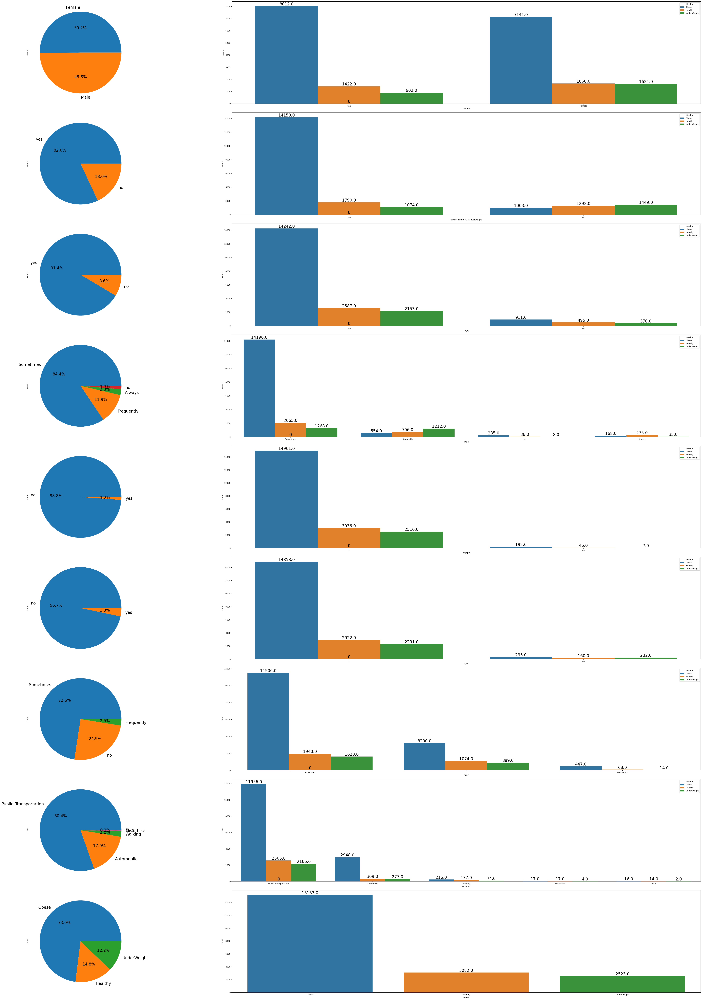

In [38]:
# PIE PLOT AND COUNTPLOTS of categorical features
import warnings
warnings.filterwarnings('ignore')
 
fig,axes=plt.subplots(nrows=len(data.select_dtypes(include='object').drop('NObeyesdad',axis=1).columns),ncols=2,figsize=(60,70))
for i,feature in enumerate(data.select_dtypes(include='object').drop('NObeyesdad',axis=1).columns):
    data[feature].value_counts().plot(kind='pie',autopct='%1.1f%%',ax=axes[i,0],textprops={'fontsize': 20})
    bx=sns.countplot(data=data,x=feature,hue='Health',ax=axes[i,1])
    for p in bx.patches:
        bx.text(p.get_x()+p.get_width()/2,p.get_height(),p.get_height(),va='bottom',ha='center',fontsize=20)
plt.tight_layout()
    

In [28]:
pd.crosstab(index=data['CAEC'],columns=data['Health'],normalize='columns',margins=True)

Health,Healthy,Obese,UnderWeight,All
CAEC,,,,
Always,0.077992,0.010861,0.017442,0.023027
Frequently,0.230573,0.035550,0.470100,0.119087
Sometimes,0.672433,0.939895,0.508721,0.844446
no,0.019002,0.013694,0.003738,0.013441


In [20]:
#pd.crosstab(index=data['CAEC'],columns=data['Health'],normalize='index',margins=True)

### <u>**Inference:**</u>

The dataset exhibits an extreme class imbalance, with 73% of individuals classified as obese, 12.2% as underweight, and the remaining as healthy.

___**Family History and Obesity Status:**___
- Analysis of the 'family_with_history_of_obesity' feature reveals a significant association with obesity status. Among obese individuals, 93.38% have a known family history of obesity, while only 0.66% do not. Conversely, among underweight individuals, 42.5% have a family history of obesity, and among healthy individuals, 58.07% have a similar family history. This underscores the importance of family history in identifying obesity, suggesting a strong dependency on familial predisposition.

___**Health Monitoring Behavior:**___
- Examination of health monitoring behavior across weight categories highlights distinct patterns. Among healthy individuals, 57% monitor their health regularly, compared to only 35% among obese individuals. Furthermore, a staggering 98% of underweight individuals do not monitor their health at all. - This ordinal behavior suggests a correlation between weight status and health monitoring habits, where healthier individuals tend to monitor their health more diligently, while obese individuals exhibit lower rates of health monitoring. Underweight individuals show the least engagement in health monitoring.

- These observations align with expected trends and provide valuable insights into the relationships between features and target classes, laying the groundwork for further analysis and model development.

___**Dietary Choices and Obesity:**___
- While dietary choices are undoubtedly important contributors to overall health, the higher frequency of consuming high-caloric food among healthy individuals challenges the simplistic assumption that obesity is solely dependent on diet. Instead, it underscores the complex interplay of various factors when it comes to obesity, including genetic predisposition and lifestyle factors.

- Therefore, a comprehensive approach to obesity prevention and management should consider multiple determinants beyond diet alone.


*EDA on numerical data*

In [1]:

num_data=data[['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE', 'BMI']]
fig,axes=plt.subplots(nrows=5,ncols=2,figsize=(40,40))
axes=axes.flatten()
for i,feature in enumerate(num_data.columns):
    sns.kdeplot(data=data,x=feature,hue='NObeyesdad',ax=axes[i])
for i in range(len(num_data.columns),len(axes)):
    fig.delaxes(axes[i])

- While observing the KDE plots for the features Age, Height, FAF, and NCP, it is evident that the curve for Obesity_Type_III exhibits a narrow, higher peak compared to the other curves on the same plot. This indicates that these features have significant discriminatory power in distinguishing this     specific class from the others.
- The Obesity_Type_III curve appears to be bimodal for features such as Height, Weight, FAF, and TUE, indicating the presence of clusters within specific ranges of these feature values for this class.
- A machine learning model benefits from features with significant discriminatory power, as these features provide valuable information that can improve model performance. Conversely, features with low variability or poor spread can introduce noise and reduce the model’s ability to make accurate predictions.

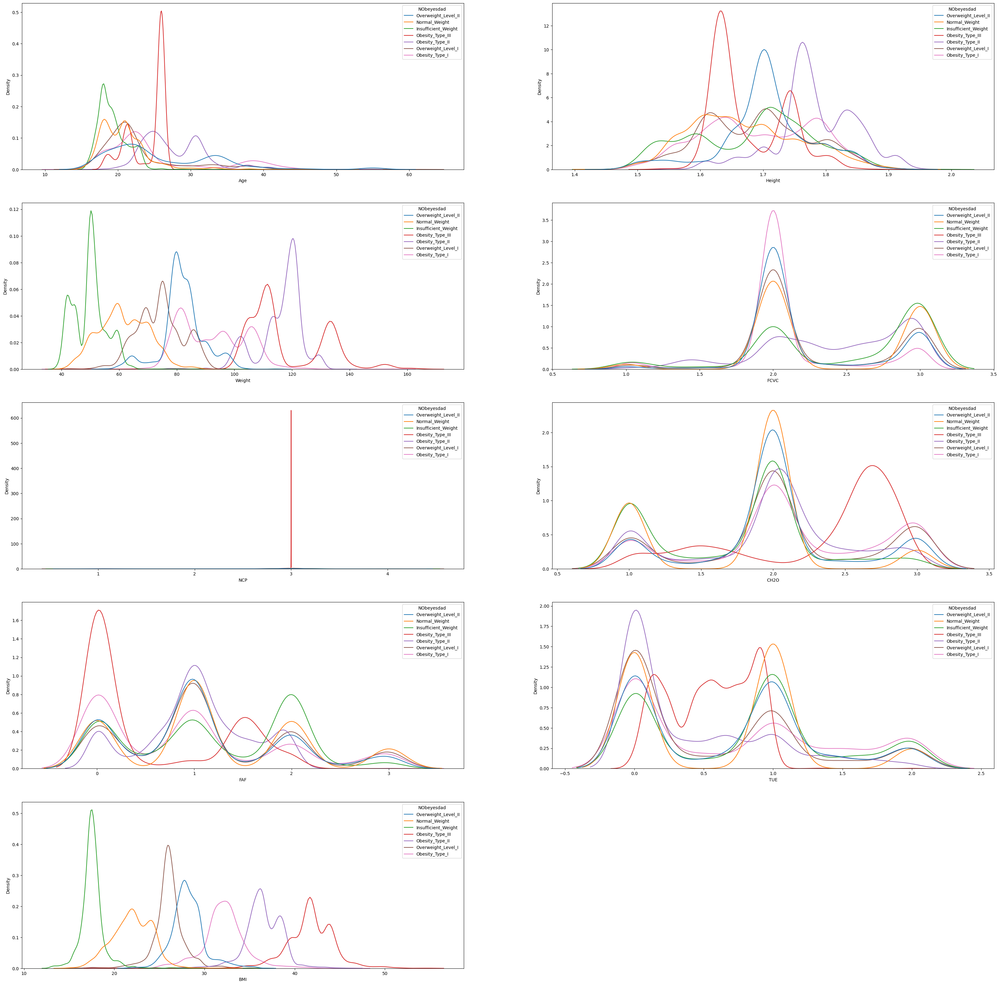

In [1055]:
# common_norm=False
num_data=data[['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE', 'BMI']]
fig,axes=plt.subplots(nrows=5,ncols=2,figsize=(40,40))
axes=axes.flatten()
for i,feature in enumerate(num_data.columns):
    sns.kdeplot(data=data,x=feature,hue='NObeyesdad',ax=axes[i],common_norm=False)

for i in range(len(num_data.columns),len(axes)):
    fig.delaxes(axes[i])

### <u>**Visualizing a KDE plot of numerical features with and without a common normalization<u>**
___**Common Normalization**___
- A kde plot when constructed using common nomralization provides information on relative differences and similarities between different classes.
- The peakedness of the distribution informed by each individual curve provides a comparison among different features and their relative densities pertaining to different classes.
- If two curves on the same plot, representing different classes of a feature's distribution occupy the same position but having different peak heights (e.g., curve A has a larger height compared to curve B), then curve A represents a higher density of instances for that feature in comparison to the class represented by curve B.
- Class imbalances pertaining to specific features can also be identified where feature contribution to a specific class can help understand
- the features contribution towards its seperation.<Br><br>

___**No Common Normalization**___
- When the curves are not normalized, meaning the sum of densities for each curve isn't equal to 1, the main point of reference for comparison becomes the feature range represented by the x-axis. 
- If a curve among several classes for a specific feature is wider than the others, it can be inferred that the specific class has a higher variance for that feature. Conversely, if a curve is narrower, it indicates lower variance.
- Clustering can be identified by identifying multiple peaks or modalities in each curve. 
- This type of representation helps visualize classes that may be deemed a minority, which can help reveal any specific patterns or behavior of the class.
- Overall this approach helps understand the specific behavior of each individual class independent of one another.


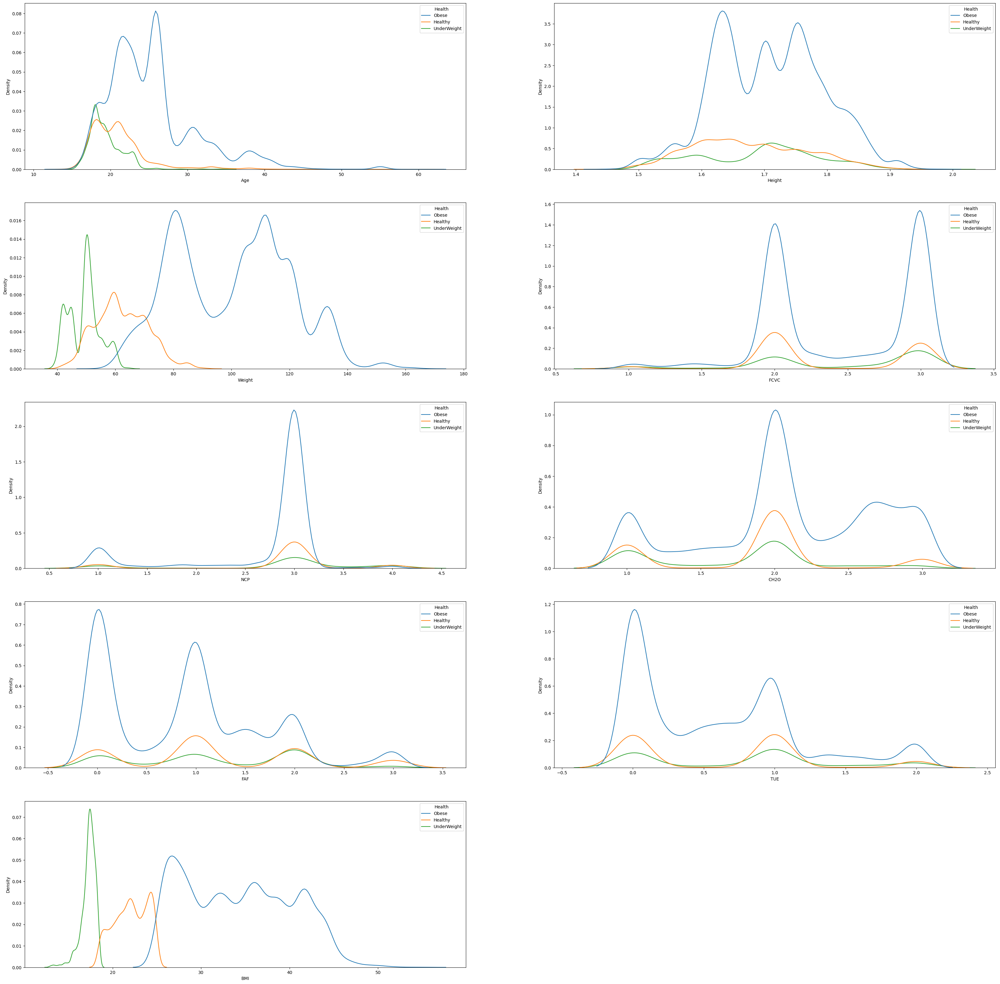

In [99]:
# EDA on numerical data

num_data=data[['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE', 'BMI']]
fig,axes=plt.subplots(nrows=5,ncols=2,figsize=(40,40))
axes=axes.flatten()
for i,feature in enumerate(num_data.columns):
    sns.kdeplot(data=data,x=feature,hue='Health',ax=axes[i])
for i in range(len(num_data.columns),len(axes)):
    fig.delaxes(axes[i])


Age          Axes(0.125,0.653529;0.227941x0.226471)
Height    Axes(0.398529,0.653529;0.227941x0.226471)
Weight    Axes(0.672059,0.653529;0.227941x0.226471)
FCVC         Axes(0.125,0.381765;0.227941x0.226471)
NCP       Axes(0.398529,0.381765;0.227941x0.226471)
CH2O      Axes(0.672059,0.381765;0.227941x0.226471)
FAF              Axes(0.125,0.11;0.227941x0.226471)
TUE           Axes(0.398529,0.11;0.227941x0.226471)
BMI           Axes(0.672059,0.11;0.227941x0.226471)
dtype: object

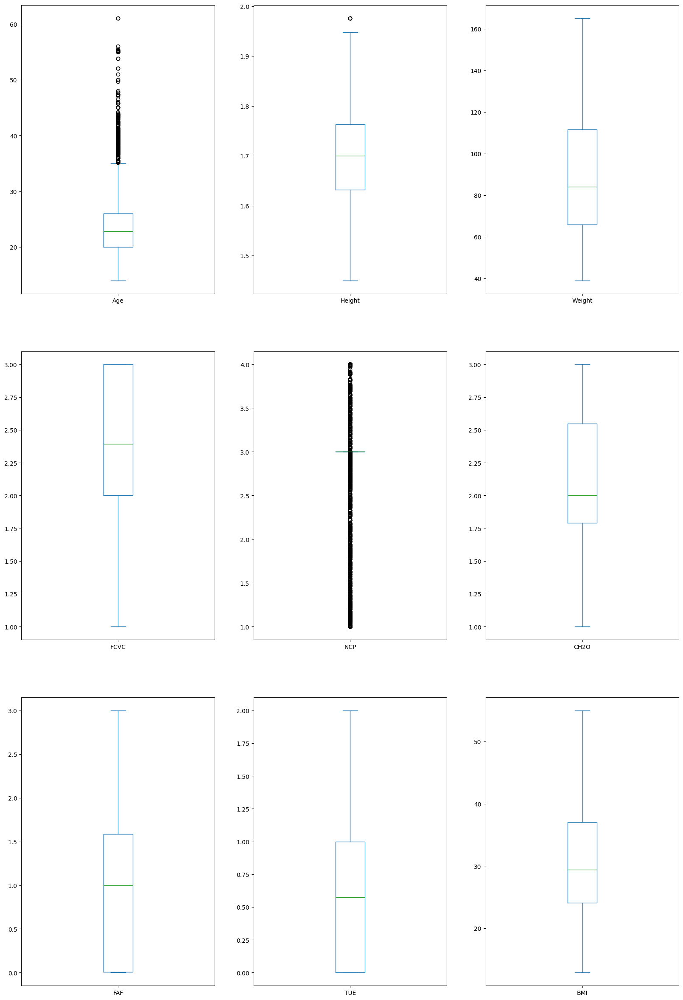

In [32]:
num_data.plot(kind='box',subplots=True,sharex=False,sharey=False,layout=(3,3),figsize=(20,30))

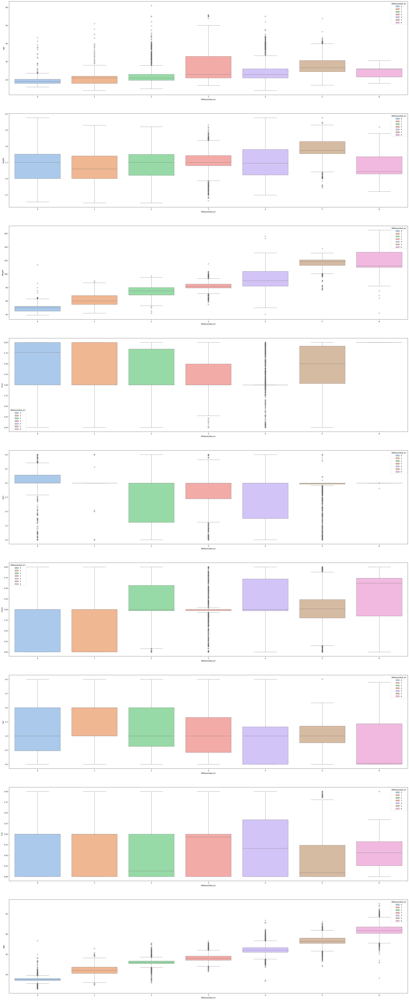

In [102]:
fig,axes=plt.subplots(nrows=9,ncols=1,figsize=(40,100))
axes=axes.flatten()
data['NObeyesdad_en']=data['NObeyesdad'].replace({'Overweight_Level_II':3, 'Normal_Weight':1, 'Insufficient_Weight':0,
       'Obesity_Type_III':6, 'Obesity_Type_II':5, 'Overweight_Level_I':2,
       'Obesity_Type_I':4})
for i,feature in enumerate(num_data.columns):
    sns.boxplot(data=data,x='NObeyesdad_en',y=feature,hue='NObeyesdad_en',ax=axes[i],palette=sns.color_palette('pastel',data['NObeyesdad'].nunique()))

**Height and Weight Analysis:**

Height does not show an expected trend of either decreasing across the different categories of weight-based classification or remaining quite constant. On the other hand, weight shows a clear linear representation.

It would be worthwhile trying to understand whether the height feature is a feature that brings in important information or just induces unnecessary noise.


In [54]:
# correlation
num_data.corr()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE,BMI
Age,1.000000,-0.011713,0.283381,0.034414,-0.048479,-0.016325,-0.192259,-0.296154,0.320842
Height,-0.011713,1.000000,0.416677,-0.071546,0.191383,0.183706,0.295278,0.076433,0.098126
Weight,0.283381,0.416677,1.000000,0.245682,0.095947,0.317914,-0.084845,-0.086471,0.941071
FCVC,0.034414,-0.071546,0.245682,1.000000,0.113349,0.101299,-0.089822,-0.147843,0.296933
NCP,-0.048479,0.191383,0.095947,0.113349,1.000000,0.080949,0.100871,0.067459,0.048736
CH2O,-0.016325,0.183706,0.317914,0.101299,0.080949,1.000000,0.082932,-0.010654,0.292142
FAF,-0.192259,0.295278,-0.084845,-0.089822,0.100871,0.082932,1.000000,0.021213,-0.210239
TUE,-0.296154,0.076433,-0.086471,-0.147843,0.067459,-0.010654,0.021213,1.000000,-0.117098
BMI,0.320842,0.098126,0.941071,0.296933,0.048736,0.292142,-0.210239,-0.117098,1.000000


### <u>**Correlation and ANOVA Analysis:</u>**

- Based on the correlation matrix, BMI is highly correlated with weight. Thus, it would be better to include either one rather than both to avoid multicollinearity.

- Since the standard categorization of BMI is proven to be close but not exactly similar to the categorization provided in the dataset, it is worthwhile to perform ANOVA and determine the specific variability of the numerical feature BMI computed from the weight and health of an individual and the categorical dependent variable NObeyesdad.

- This could provide us an understanding of how we could use BMI for an initial assessment prior to using a model to make predictions.


In [61]:
q=data.groupby('NObeyesdad')['BMI']
type(q)

pandas.core.groupby.generic.SeriesGroupBy

In [76]:
# shapiro test
from scipy import stats
for category,grouped_data in data.groupby('NObeyesdad')['BMI']:
    if len(grouped_data)>=3:
        stat,p_value=stats.shapiro(grouped_data)
        print(f"\n\nShapiro-Wilk test result for Category- {category}:")
        print("Test Statistic:", stat)
        print("p-value:", p_value)
        if p_value>=0.05:
            print('Fail to reject null hypothesis the numerical feature for the specific group {} is normally distributed'.format(category))
        else:
            print('Reject the null hypothesis the numerical feature corresponding to the specific category is not normally distributed'.format(category))



Shapiro-Wilk test result for Category- Insufficient_Weight:
Test Statistic: 0.7948797345161438
p-value: 0.0
Reject the null hypothesis the numerical feature corresponding to the specific category is not normally distributed


Shapiro-Wilk test result for Category- Normal_Weight:
Test Statistic: 0.9919154047966003
p-value: 3.656977064919742e-12
Reject the null hypothesis the numerical feature corresponding to the specific category is not normally distributed


Shapiro-Wilk test result for Category- Obesity_Type_I:
Test Statistic: 0.9452360272407532
p-value: 1.3556484991394798e-31
Reject the null hypothesis the numerical feature corresponding to the specific category is not normally distributed


Shapiro-Wilk test result for Category- Obesity_Type_II:
Test Statistic: 0.9517330527305603
p-value: 1.8473904648313955e-31
Reject the null hypothesis the numerical feature corresponding to the specific category is not normally distributed


Shapiro-Wilk test result for Category- Obesity_Type_I

In [79]:
# kruskal
from scipy.stats import kruskal
stats,p_value=kruskal(*list( grouped_data for category,grouped_data in data.groupby('NObeyesdad')['BMI']))
if p_value < 0.05:
    print("There is a significant difference in BMI between the different categories of NObeyesdad.")
else:
    print("There is no significant difference in BMI between the different categories of NObeyesdad.")

There is a significant difference in BMI between the different categories of NObeyesdad.


In [95]:
# effect size of BMI on NObeyesdad
n=len(data)    
k=len(list( grouped_data for category,grouped_data in data.groupby('NObeyesdad')['BMI']))
# or k=data['NObeyesdad'].nunique()
eta_squared=(stats-k+1)/(n-k)
print(f"Effect Size (Eta-Squared): {eta_squared}")
print(f'The independent variable BMI explains about {np.round(eta_squared*100,2)}% of variance observed in the dependent variable indicating the variation in independent variable largeley accounts for variation in dependent variable NObeyesdad. This presents a reliable and strong association between the two variables')

Effect Size (Eta-Squared): 0.9372634468149428
The independent variable BMI explains about 93.73% of variance observed in the dependent variable indicating the variation in independent variable largeley accounts for variation in dependent variable NObeyesdad. This presents a reliable and strong association between the two variables


In [101]:
# effect size of height on NObeyesdad
stats,p_value=kruskal(*list(grouped_data for _,grouped_data in data.groupby('NObeyesdad')['Height']))
if p_value < 0.05:
    print("There is a significant difference in Height between the different categories of NObeyesdad.")
else:
    print("There is no significant difference in Height between the different categories of NObeyesdad.")
n=len(data)
k=data['NObeyesdad'].nunique()
eta_squared=(stats-k+1)/(n-k)
print(f"\nEffect Size (Eta-Squared): {eta_squared}")
print(f'The independent variable height explains about {np.round(eta_squared*100,2)}% of variance observed in the dependent variable indicating the variation in independent variable largeley accounts for variation in dependent variable NObeyesdad. This presents a reliable and strong association between the two variables')

There is a significant difference in Height between the different categories of NObeyesdad.

Effect Size (Eta-Squared): 0.18493491978675292
The independent variable height explains about 18.49% of variance observed in the dependent variable indicating the variation in independent variable largeley accounts for variation in dependent variable NObeyesdad. This presents a reliable and strong association between the two variables


In [103]:
# effect size of height on NObeyesdad
stats,p_value=kruskal(*list(grouped_data for _,grouped_data in data.groupby('NObeyesdad')['Weight']))
if p_value < 0.05:
    print("There is a significant difference in Weight between the different categories of NObeyesdad.")
else:
    print("There is no significant difference in Weight between the different categories of NObeyesdad.")
n=len(data)
k=data['NObeyesdad'].nunique()
eta_squared=(stats-k+1)/(n-k)
print(f"\nEffect Size (Eta-Squared): {eta_squared}")
print(f'The independent variable Weight explains about {np.round(eta_squared*100,2)}% of variance observed in the dependent variable indicating the variation in independent variable largeley accounts for variation in dependent variable NObeyesdad. This presents a reliable and strong association between the two variables')

There is a significant difference in Weight between the different categories of NObeyesdad.

Effect Size (Eta-Squared): 0.873850554333094
The independent variable Weight explains about 87.39% of variance observed in the dependent variable indicating the variation in independent variable largeley accounts for variation in dependent variable NObeyesdad. This presents a reliable and strong association between the two variables


### <u>**Inference Based on Effect Size:</u>**

- BMI has a strong association with NObeyesdad.

- Height has a small yet moderate association with NObeyesdad.

- Weight does have a strong association with NObeyesdad but relatively lesser than BMI.

- Since weight and height make up the new feature, based on the effect size and correlation observed, weight tends to have more relevance in comparison to height, and height tends to show no significant relation to BMI.


### <u>**Model Building<u>**

In [28]:
#for i in num_data.columns:
#    print(i,'----Nunique-',data[i].nunique())
#    print('--------------------')
#    print(num_data[i].unique())
#    print('------------\n')

In [30]:
data_org['BMI']=data_org['Weight']/(data_org['Height'])**2
data_org['BMI_bin']=pd.cut(data_org['BMI'],bins=[(data['BMI'].min()-1),18.5,25,30,35,40,45,(data['BMI'].max()+1)],
                       labels=['Insufficient_Weight','Normal_Weight', 'Overweight_Level_I','Overweight_Level_II',
                              'Obesity_Type_I','Obesity_Type_II','Obesity_Type_III'])
data_org['Health']=data_org['BMI_bin'].apply(lambda x: 'Obese' if x in ['Overweight_Level_II','Obesity_Type_III', 'Obesity_Type_II', 'Overweight_Level_I',
       'Obesity_Type_I'] else 'UnderWeight' if x=='Insufficient_Weight' else 'Healthy')
data_org.drop_duplicates(inplace=True)
data_m=pd.concat([data,data_org],axis=0)
data_model=data_m.drop(['Health','BMI_bin','NObeyesdad_en','BMI'],axis=1)



In [31]:
#data_model=data_model.drop(['Health','BMI_bin'],axis=1)
# identifying potential ordinal and nonordinal categorical variables
bin=[]
for i in data_model.columns:
    if data_model[i].dtype=='object':
        if data_model[i].nunique()==2:
            bin.append(i)
        else:
            print(i,'--------',data_m[i].nunique())
            print('------------------------------------')
            print('values--','\n',data_m[i].unique(),'\n\n')

CAEC -------- 4
------------------------------------
values-- 
 ['Sometimes' 'Frequently' 'no' 'Always'] 


CALC -------- 4
------------------------------------
values-- 
 ['Sometimes' 'no' 'Frequently' 'Always'] 


MTRANS -------- 5
------------------------------------
values-- 
 ['Public_Transportation' 'Automobile' 'Walking' 'Motorbike' 'Bike'] 


NObeyesdad -------- 7
------------------------------------
values-- 
 ['Overweight_Level_II' 'Normal_Weight' 'Insufficient_Weight'
 'Obesity_Type_III' 'Obesity_Type_II' 'Overweight_Level_I'
 'Obesity_Type_I'] 




___**Catgeorizing the independent variables based on the type of values**___

In [32]:
bin_data=data_model[bin]
ordinal_data=data_model[['CAEC','CALC']]
non_ord_data=data[['MTRANS']]
target_data=data_model[['NObeyesdad']]
num_data=data[['Age', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE','Height','Weight']]
data_model['NObeyesdad']=data_model['NObeyesdad'].replace({'Overweight_Level_II':3, 'Normal_Weight':1, 'Insufficient_Weight':0,
       'Obesity_Type_III':6, 'Obesity_Type_II':5, 'Overweight_Level_I':2,
       'Obesity_Type_I':4})   
X=data_model.drop(['NObeyesdad'],axis=1)
y=data_model['NObeyesdad']


In [33]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)


___**<u>Preprocesing_1- using ordinal_encoding<u>**___

In [34]:

from sklearn.preprocessing import OrdinalEncoder
encoder=OrdinalEncoder()
X_train_1=X_train.copy()
X_test_1=X_test.copy()
X_train_1[ordinal_data.columns]=encoder.fit_transform(X_train[ordinal_data.columns])
X_test_1[ordinal_data.columns]=encoder.transform(X_test[ordinal_data.columns])

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from category_encoders import BinaryEncoder
numerical_transformer=Pipeline(steps=[('scaler',StandardScaler())])
non_ordinal_transformer=Pipeline(steps=[('encoder',OneHotEncoder(handle_unknown='ignore'))])
bin_transformer=Pipeline(steps=[('encoder',BinaryEncoder(handle_unknown='ignore'))])
preprocessor_1=ColumnTransformer(transformers=[('num',numerical_transformer,num_data.columns),
                                            ('non_ord',non_ordinal_transformer,non_ord_data.columns),
                                              ('bin',bin_transformer,bin_data.columns)],
                              remainder='passthrough')
pipeline_1=Pipeline(steps=[('preprocessor_1',preprocessor_1)])

X_train_1=pd.DataFrame(pipeline_1.fit_transform(X_train_1),index=X_train.index,columns=pipeline_1.named_steps['preprocessor_1'].get_feature_names_out())
X_test_1=pd.DataFrame(pipeline_1.transform(X_test_1),index=X_test.index,columns=pipeline_1.named_steps['preprocessor_1'].get_feature_names_out())

___**<u>Preprocessing_2- using get_dummies<U>**___

In [35]:

all_cat_data=data[((non_ord_data.columns).append(bin_data.columns)).append(ordinal_data.columns)]

from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train_2=X_train.copy()
X_test_2=X_test.copy()

# scaling
X_train_2[num_data.columns]=scaler.fit_transform(X_train_2[num_data.columns])
X_test_2[num_data.columns]=scaler.transform(X_test_2[num_data.columns])

X_train_2=pd.DataFrame(X_train_2,index=X_train.index,columns=X_train_2.columns)
X_test_2=pd.DataFrame(X_test_2,index=X_test.index,columns=X_test_2.columns)


X_temp=pd.concat([X_train_2,X_test_2],axis=0,keys=['train','test'])
X_temp=pd.get_dummies(X_temp,columns=all_cat_data.columns)
X_train_2=X_temp.xs('train')
X_test_2=X_temp.xs('test')

___**<u>Preprocessing_3- target encoding<U>**___

In [36]:

all_cat_data=data[((non_ord_data.columns).append(bin_data.columns)).append(ordinal_data.columns)]
from category_encoders import TargetEncoder
from sklearn.preprocessing import StandardScaler
X_train_3=X_train.copy()
X_test_3=X_test.copy()
scaler=StandardScaler()
encoder=TargetEncoder(cols=all_cat_data.columns,smoothing=0.3)

# scaling
X_train_3[num_data.columns]=scaler.fit_transform(X_train_3[num_data.columns])
X_test_3[num_data.columns]=scaler.transform(X_test_3[num_data.columns])

# encoding
X_train_3[all_cat_data.columns]=encoder.fit_transform(X_train_3[all_cat_data.columns],y_train)
X_test_3[all_cat_data.columns]=encoder.transform(X_test_3[all_cat_data.columns])

X_train_3=pd.DataFrame(X_train_3,index=X_train.index,columns=X_train_3.columns)
X_test_3=pd.DataFrame(X_test_3,index=X_test.index,columns=X_test_3.columns)

In [37]:
preprocessed=[('preprocessing_1',X_train_1,X_test_1),('preprocessing_2',X_train_2,X_test_2),('preprocessing_3',X_train_3,X_test_3)]

### **<U>Baseline Validation<u>**

In [236]:

import lightgbm as lgb
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import cohen_kappa_score,accuracy_score,classification_report,log_loss
models={'XGB':xgb.XGBClassifier(random_state=42,verbosity=0),'LGB':lgb.LGBMClassifier(random_state=42,verbosity=-1),
        'randomforestclassifier':RandomForestClassifier(random_state=42)}
pre=[]
model_type=[]
accuracy=[]
cohen=[]
logloss=[]
r2score=[]
f1=[]

for i in preprocessed:
    print('------------------------------------------------')
    print('\n\nPreprocessing_technique-',i[0])
    print('------------------------------------------------')
    for model_name,model in models.items():
        pre.append(i[0])
        model.fit(i[1],y_train)
        print('\nMODEL-',model_name)
        model_type.append(model_name)
        accuracy.append(accuracy_score(y_test,model.predict(i[2])))
        cohen.append(cohen_kappa_score(y_test,model.predict(i[2])))
        logloss.append(log_loss(y_test,model.predict_proba(i[2])))
        r2score.append(r2_score(y_test,model.predict(i[2])))
        f1.append(f1_score(y_test,model.predict(i[2]),average='macro'))

        y_test_classes=pd.DataFrame(y_test).replace({3:'Overweight_Level_II',1:'Normal_Weight',0: 'Insufficient_Weight',
        6:'Obesity_Type_III',5:'Obesity_Type_II',2:'Overweight_Level_I',4:'Obesity_Type_I'})
        y_pred=model.predict(i[2])
        y_pred_classes=pd.DataFrame(y_pred).replace({3:'Overweight_Level_II',1:'Normal_Weight',0: 'Insufficient_Weight',
        6:'Obesity_Type_III',5:'Obesity_Type_II',2:'Overweight_Level_I',4:'Obesity_Type_I'})
        
        print(classification_report(y_test_classes,y_pred_classes))
baseline_models=pd.DataFrame({'Preprocessing_Technique':pre,'Models':model_type,'Accuracy':accuracy,'Cohen':cohen,'log_loss':logloss,'R2':r2score,'F1_score':f1})

------------------------------------------------


Preprocessing_technique- preprocessing_1
------------------------------------------------

MODEL- XGB
                     precision    recall  f1-score   support

Insufficient_Weight       0.93      0.94      0.94       574
      Normal_Weight       0.89      0.88      0.88       677
     Obesity_Type_I       0.92      0.88      0.90       682
    Obesity_Type_II       0.96      0.97      0.97       697
   Obesity_Type_III       1.00      1.00      1.00       878
 Overweight_Level_I       0.80      0.83      0.81       525
Overweight_Level_II       0.83      0.83      0.83       536

           accuracy                           0.91      4569
          macro avg       0.90      0.90      0.90      4569
       weighted avg       0.91      0.91      0.91      4569


MODEL- LGB
                     precision    recall  f1-score   support

Insufficient_Weight       0.93      0.95      0.94       574
      Normal_Weight       0.90      0.

In [237]:
baseline_models.style.background_gradient()

,Preprocessing_Technique,Models,Accuracy,Cohen,log_loss,R2,F1_score
0,preprocessing_1,XGB,0.912672,0.897620,0.272758,0.966311,0.903798
1,preprocessing_1,LGB,0.912672,0.897624,0.267619,0.966619,0.903516
2,preprocessing_1,randomforestclassifier,0.901948,0.885047,0.394815,0.962773,0.891367
3,preprocessing_2,XGB,0.910046,0.894542,0.273115,0.964875,0.900725
4,preprocessing_2,LGB,0.913110,0.898130,0.268737,0.966721,0.903933
5,preprocessing_2,randomforestclassifier,0.895382,0.877345,0.411310,0.961081,0.883989
6,preprocessing_3,XGB,0.913767,0.898905,0.272454,0.966362,0.904738
7,preprocessing_3,LGB,0.911359,0.896081,0.268447,0.967336,0.901902
8,preprocessing_3,randomforestclassifier,0.908295,0.892495,0.368623,0.967285,0.898258


*top performing models preprocessing_1 (XGB,LGB) preprocessing_2(LGB) and preprocessing_3(XGB)*

In [38]:
preprocessed=[('preprocessing_1',X_train_1,X_test_1),('preprocessing_2',X_train_2,X_test_2),('preprocessing_3',X_train_3,X_test_3)]

In [147]:
model=xgb.XGBClassifier(random_state=42,verbosity=0)
model.fit(X_train_1,y_train)
fi_imp=model.feature_importances_
xgb_p1_imp_df=pd.DataFrame({'Features':X_train_1.columns,'Imp':fi_imp})
xgb_p1_imp_df=xgb_p1_imp_df.sort_values(by='Imp',ascending=False)

model=lgb.LGBMClassifier(random_state=42,verbosity=-1)
model.fit(X_train_1,y_train)
fi_imp=model.feature_importances_
lgb_p1_imp_df=pd.DataFrame({'Features':X_train_1.columns,'Imp':fi_imp})
lgb_p1_imp_df=lgb_p1_imp_df.sort_values(by='Imp',ascending=False)

model=lgb.LGBMClassifier(random_state=42,verbosity=-1)
model.fit(X_train_2,y_train)
fi_imp=model.feature_importances_
lgb_p2_imp_df=pd.DataFrame({'Features':X_train_2.columns,'Imp':fi_imp})
lgb_p2_imp_df=lgb_p2_imp_df.sort_values(by='Imp',ascending=False)

model=xgb.XGBClassifier(random_state=42,verbosity=0)
model.fit(X_train_3,y_train)
fi_imp=model.feature_importances_
xgb_p3_imp_df=pd.DataFrame({'Features':X_train_3.columns,'Imp':fi_imp})
xgb_p3_imp_df=xgb_p3_imp_df.sort_values(by='Imp',ascending=False)

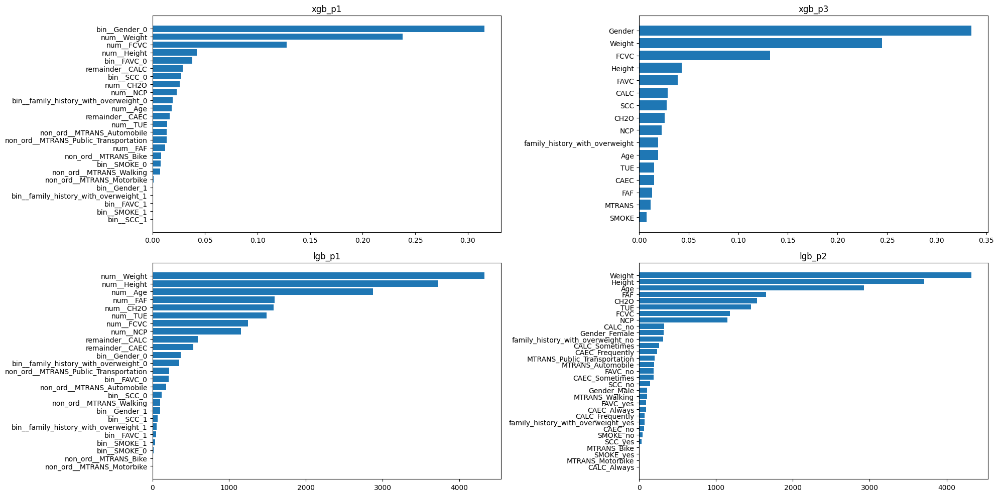

In [149]:
fig,axes=plt.subplots(nrows=2,ncols=2,figsize=(20,10))
axes=axes.flatten()
for i,df in enumerate([('xgb_p1',xgb_p1_imp_df),('xgb_p3',xgb_p3_imp_df),('lgb_p1',lgb_p1_imp_df),('lgb_p2',lgb_p2_imp_df)]):
    axes[i].barh(df[1]['Features'],df[1]['Imp'])
    axes[i].set_title(df[0])
    axes[i].invert_yaxis()
plt.tight_layout()    

- Previosuly we had made an observation that Obesity_Type_I, Obesity_Type_II, Obesity_Type_III and Overweight_Level_I could not be predicted using just
- BMI based on the very low recall scores.
- The model tends to capture significant information pertaining to these classes when implememented with all the provided features  in the dataset.
- As observed in all iterations of model building, Obesity_Type_III holds a recall of 1.0 which could potentially mean that models overfit to this specific class.

#### __<u>**Overall Model Performances**</u>__
- The overall performances looks good for all the models 
- Accuracy for the models range from 89.5% to 91.3%

#### __<u>**Class-Specific Performance**</u>__
- The accuracy is prominently affected by predictions made for instances corresponding to classes, 
- Overweight_Level_1 and Overweight_Level_11 where the recall is relatively lower for all models 
- with Overweight_Level_1 being more harder to predict.

#### __<u>**Recall Performance**</u>__
- Even though class 4 (Obesity_Type_1) instances do have a good recall throughout all the models, 
- it's still lower than class 0 (Insufficient_Weight) which has lesser support.

#### __<u>**Comparison with BMI**</u>__
- As observed earlier, Overweight_level_11 had a lower recall when determined just using standard BMI, 
- while Overweight_Level_1 had a much significant recall then.
- A significant improvement can be observed in correctly identifying Overweight_Level_11 using all available features.

#### __<u>**Dataset Quality and Representation**</u>__
- Based on dataset quality, it could be established that class 2 (Overweight_Level_I) and 3 (Overweight_Level_II), 
- which have the least representation in the training set, may be the reason towards the model's inability 
- to prioritize these classes relative to others. 

#### __<u>**Log Loss Analysis**</u>__
- On the basis of log_loss, the least confident model among XGB, LGB, and RF across all preprocessing models is RF.
- Please note that there are 7 classes in the dataset and a confidence probability of 14% corresponds to each class 
- based on random guessing. A well-trained model must perform better than these random estimates given that our 
- logloss for all RF models on an average measures at 0.3926, which corresponds to an average confidence across 
- all classes of 67.2%, which is still pretty good. But relatively the average logloss of LGB and XGB models 
- across all preprocessing techniques are at 0.268 and 0.2725 respectively, which corresponds to confidence of 
- 76.8% for LGB and 76.18% for XGB models. Thus, the base models tend to have a strong confidence in their predictions, 
- making the logloss metric a stronger characteristic of the model in comparison to other metrics.


#### __<u>**Hyperparameter Tuning Strategy**</u>__
- We can try tuning the hyperparameters for XGB and LGB, which are booster models capable of handling complexities within the dataset.
- Given the model and dataset's nature, which causes lower recall for a few classes due to the inherent nature of the dataset, 
  it would be more logical and beneficial to conduct tuning to improve the overall logloss rather than accuracy.
- Accuracy is a metric that could provide a less informative measurement of the model's ability to make predictions on different classes, 
  as a few may be underrepresented.


In [571]:
# xgb-preprocessing_3 hyperparameter optimization (logloss) using Bayesian optimization and cross_validation

from hyperopt import tpe,hp,fmin,Trials,STATUS_OK
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss, cohen_kappa_score
import xgboost as xgb
import numpy as np
import time


cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

space={
    'n_estimators':hp.quniform('n_estimators',400,700,1),
    'max_depth':hp.quniform('max_depth',4,18,2),
    'min_child_weight':hp.quniform('min_child_weight',0,20,1),
    'learning_rate':hp.uniform('learning_rate',0.01,0.3),
    'colsample_bytree':hp.uniform('colsample_bytree',0.4,1),
    'subsample':hp.uniform('subsample',0.4,1),
    'reg_alpha':hp.uniform('reg_alpha',0,2.5),
    'reg_lambda':hp.uniform('reg_lambda',0,2.5)
}

final_logloss=[]
final_cohen_kappa_score=[]

start_time=time.time()

def objective_fn(params):
    
    params['n_estimators']=int(params['n_estimators'])
    params['min_child_weight']=int(params['min_child_weight'])
    params['max_depth']=int(params['max_depth'])
    params['objective']='multi:softprob'
    params['num_class']=7


    param_iter_logloss=[]
    param_iter_cohen=[]
    
    for fold,(train_idx,valid_idx) in enumerate(cv.split(X_train_3,y_train)):

        training_set=xgb.DMatrix(X_train_3.iloc[train_idx],label=y_train.iloc[train_idx])
        validation_set=xgb.DMatrix(X_train_3.iloc[valid_idx],label=y_train.iloc[valid_idx])

        evals_result={}
        
        params_1=params.copy()
        del params_1['n_estimators']
        
        model=xgb.train(params_1,dtrain=training_set,num_boost_round=params['n_estimators'],evals=[(training_set,'training_set'),(validation_set,'validation_set')],
                       early_stopping_rounds=50,evals_result=evals_result,verbose_eval=False)

        y_predict_prob=model.predict(validation_set,iteration_range=(0,model.best_iteration))
        y_predict=np.argmax(y_predict_prob,axis=1)
        
        param_iter_logloss.append(log_loss(y_train.iloc[valid_idx],y_predict_prob))
        param_iter_cohen.append(cohen_kappa_score(y_train.iloc[valid_idx],y_predict))
        
    score=np.mean(param_iter_logloss)
    final_logloss.append(score)
    final_cohen_kappa_score.append(np.mean(param_iter_cohen))

    return {'loss': score, 'status': STATUS_OK}

trials=Trials()
best_0=fmin(fn=objective_fn,trials=trials,algo=tpe.suggest,max_evals=150,rstate=np.random.default_rng(42),space=space)
print('The best hyperparameters found for the dataset based on logloss is:', best_0) 

end_time=time.time()
print(f"Iteration completed in {end_time - start_time:.2f} seconds")    

100%|██████████████████████████████████████████| 150/150 [6:20:41<00:00, 152.28s/trial, best loss: 0.24911567977647384]
The best hyperparameters found for the dataset based on logloss is: {'colsample_bytree': 0.5259358761810902, 'learning_rate': 0.07416531924132465, 'max_depth': 6.0, 'min_child_weight': 0.0, 'n_estimators': 437.0, 'reg_alpha': 1.7168347661878087, 'reg_lambda': 0.74935100947915, 'subsample': 0.6504474010029635}
Iteration completed in 22841.35 seconds


In [572]:
# xgb-preprocessing_2 hyperparameter optimization (logloss) by using Bayesian optimization and cross_validation

from hyperopt import tpe,hp,fmin,Trials,STATUS_OK
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss, cohen_kappa_score
import xgboost as xgb
import numpy as np
import time


cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

space={
    'n_estimators':hp.quniform('n_estimators',400,700,1),
    'max_depth':hp.quniform('max_depth',4,18,2),
    'min_child_weight':hp.quniform('min_child_weight',0,20,1),
    'learning_rate':hp.uniform('learning_rate',0.01,0.3),
    'colsample_bytree':hp.uniform('colsample_bytree',0.4,1),
    'subsample':hp.uniform('subsample',0.4,1),
    'reg_alpha':hp.uniform('reg_alpha',0,2.5),
    'reg_lambda':hp.uniform('reg_lambda',0,2.5)
}

final_logloss_1=[]
final_cohen_kappa_score_1=[]

start_time=time.time()

def objective_fn(params):
    
    params['n_estimators']=int(params['n_estimators'])
    params['min_child_weight']=int(params['min_child_weight'])
    params['max_depth']=int(params['max_depth'])
    params['objective']='multi:softprob'
    params['num_class']=7


    param_iter_logloss=[]
    param_iter_cohen=[]
    
    for fold,(train_idx,valid_idx) in enumerate(cv.split(X_train_2,y_train)):

        training_set=xgb.DMatrix(X_train_2.iloc[train_idx],label=y_train.iloc[train_idx])
        validation_set=xgb.DMatrix(X_train_2.iloc[valid_idx],label=y_train.iloc[valid_idx])

        evals_result={}
        
        params_1=params.copy()
        del params_1['n_estimators']
        
        model=xgb.train(params_1,dtrain=training_set,num_boost_round=params['n_estimators'],evals=[(training_set,'training_set'),(validation_set,'validation_set')],
                       early_stopping_rounds=50,evals_result=evals_result,verbose_eval=False)

        y_predict_prob=model.predict(validation_set,iteration_range=(0,model.best_iteration))
        y_predict=np.argmax(y_predict_prob,axis=1)
        
        param_iter_logloss.append(log_loss(y_train.iloc[valid_idx],y_predict_prob))
        param_iter_cohen.append(cohen_kappa_score(y_train.iloc[valid_idx],y_predict))
        
    score=np.mean(param_iter_logloss)
    final_logloss_1.append(score)
    final_cohen_kappa_score_1.append(np.mean(param_iter_cohen))

    return {'loss': score, 'status': STATUS_OK}

trials=Trials()
best_1=fmin(fn=objective_fn,trials=trials,algo=tpe.suggest,max_evals=150,rstate=np.random.default_rng(42),space=space)
print('The best hyperparameters found for the dataset based on logloss is:', best_1) 

end_time=time.time()
print(f"Iteration completed in {end_time - start_time:.2f} seconds")    

100%|███████████████████████████████████████████| 150/150 [1:38:20<00:00, 39.33s/trial, best loss: 0.24901989986095852]
The best hyperparameters found for the dataset based on logloss is: {'colsample_bytree': 0.41568143501025034, 'learning_rate': 0.06228536477594174, 'max_depth': 6.0, 'min_child_weight': 8.0, 'n_estimators': 480.0, 'reg_alpha': 0.5976630304416811, 'reg_lambda': 1.0766306287774818, 'subsample': 0.8093273368262248}
Iteration completed in 5900.12 seconds


In [40]:
# lgb-preprocessing_3 optuna optimization (accuracy) and cross_validation

import optuna
from sklearn.model_selection import StratifiedKFold
import lightgbm as lgb
import numpy as np
import time


cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

final_logloss_5=[]
final_cohen_kappa_score_5=[]
final_accuracy_5=[]

def objective_fn(trial):
    
    params={
        'n_estimators':trial.suggest_int('n_estimators',400,700),
        'max_depth':trial.suggest_int('max_depth',4,18),
        #'min_child_weight':trial.suggest_int('min_child_weight',0,20),
        #'min_child_samples':trial.suggest_int('min_child_samples',10,100),
        'learning_rate':trial.suggest_float('learning_rate',0.01,0.3),
        'colsample_bytree':trial.suggest_float('colsample_bytree',0.4,1),
        'subsample':trial.suggest_float('subsample',0.4,1),
        'lambda_l1':trial.suggest_float('reg_alpha',0,2.5),
        'lambda_l2':trial.suggest_float('reg_lambda',0,2.5),
        'num_class':7,
        'objective':'multiclass',
        'early_stopping_rounds':50,
        'verbosity':-1
        
        
    }

    param_iter_logloss=[]
    param_iter_cohen=[]
    param_iter_accuracy=[]

    for fold,(train_idx,valid_idx) in enumerate(cv.split(X_train_2,y_train)):

        params_1=params.copy()
        del params_1['n_estimators']
        

        training_set=lgb.Dataset(X_train_2.iloc[train_idx],label=y_train.iloc[train_idx])
        validation_set=lgb.Dataset(X_train_2.iloc[valid_idx],label=y_train.iloc[valid_idx])

        model=lgb.train(params_1,training_set,params['n_estimators'],valid_sets=[training_set,validation_set])

        y_predict_prob=model.predict(X_train_2.iloc[valid_idx],num_iteration=model.best_iteration)
        y_predict=np.argmax(y_predict_prob,axis=1)
        param_iter_logloss.append(log_loss(y_train.iloc[valid_idx],y_predict_prob))
        param_iter_cohen.append(cohen_kappa_score(y_train.iloc[valid_idx],y_predict))
        param_iter_accuracy.append(accuracy_score(y_train.iloc[valid_idx],y_predict))

    #score=np.mean(param_iter_logloss)
    score=np.mean(param_iter_accuracy)
    final_logloss_5.append(score)
    final_accuracy_5.append(score)
    final_cohen_kappa_score_5.append(np.mean(param_iter_cohen))

    return score
    
study_1=optuna.create_study(direction='maximize')
study_1.optimize(objective_fn,n_trials=150)
print('The best hyperparameters found for the dataset based on logloss is:', study_1.best_params) 

end_time=time.time()
print(f"Iteration completed in {end_time - start_time:.2f} seconds")        
                        
        

[I 2024-08-05 21:46:03,038] A new study created in memory with name: no-name-cbab1ab2-70a1-41cd-94d7-f59280721b86
[I 2024-08-05 21:46:09,992] Trial 0 finished with value: 0.9111405496502198 and parameters: {'n_estimators': 562, 'max_depth': 16, 'learning_rate': 0.17570014342894427, 'colsample_bytree': 0.9244384426991261, 'subsample': 0.9681331397189453, 'reg_alpha': 0.13874220877039017, 'reg_lambda': 0.9889644232058276}. Best is trial 0 with value: 0.9111405496502198.
[I 2024-08-05 21:46:32,959] Trial 1 finished with value: 0.9153539260088545 and parameters: {'n_estimators': 546, 'max_depth': 5, 'learning_rate': 0.022904302010063576, 'colsample_bytree': 0.49801512487361765, 'subsample': 0.7348984992759324, 'reg_alpha': 2.0754199350410096, 'reg_lambda': 1.6391194575854473}. Best is trial 1 with value: 0.9153539260088545.
[I 2024-08-05 21:47:07,628] Trial 2 finished with value: 0.914204785267626 and parameters: {'n_estimators': 634, 'max_depth': 5, 'learning_rate': 0.020801947483069478, 

The best hyperparameters found for the dataset based on logloss is: {'n_estimators': 632, 'max_depth': 6, 'learning_rate': 0.022701691754910897, 'colsample_bytree': 0.41967005293403287, 'subsample': 0.44062877619608154, 'reg_alpha': 1.5428773101442639, 'reg_lambda': 0.7946489009697298}


NameError: name 'start_time' is not defined

In [43]:
# lgb-preprocessing_3 optuna optimization (accuracy) directly with no cross validation

import optuna
from sklearn.model_selection import StratifiedKFold
import lightgbm as lgb
import numpy as np
import time


cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

final_logloss_5=[]
final_cohen_kappa_score_5=[]
final_accuracy_5=[]

def objective_fn(trial):
    
    params={
        'n_estimators':trial.suggest_int('n_estimators',400,700),
        'max_depth':trial.suggest_int('max_depth',4,18),
        #'min_child_weight':trial.suggest_int('min_child_weight',0,20),
        #'min_child_samples':trial.suggest_int('min_child_samples',10,100),
        'learning_rate':trial.suggest_float('learning_rate',0.01,0.3),
        'colsample_bytree':trial.suggest_float('colsample_bytree',0.4,1),
        'subsample':trial.suggest_float('subsample',0.4,1),
        'lambda_l1':trial.suggest_float('reg_alpha',0,2.5),
        'lambda_l2':trial.suggest_float('reg_lambda',0,2.5),
        'num_class':7,
        'objective':'multiclass',
        'early_stopping_rounds':50,
        'verbosity':-1
        
        
    }


    params_1=params.copy()
    del params_1['n_estimators']
        

    training_set=lgb.Dataset(X_train_2,label=y_train)
    validation_set=lgb.Dataset(X_test_2,label=y_test)

    model=lgb.train(params_1,training_set,params['n_estimators'],valid_sets=[training_set,validation_set])

    y_predict_prob=model.predict(X_test_2,num_iteration=model.best_iteration)
    y_predict=np.argmax(y_predict_prob,axis=1)
    score=accuracy_score(y_test,y_predict)

    return score
    
study_1=optuna.create_study(direction='maximize')
study_1.optimize(objective_fn,n_trials=150)
print('The best hyperparameters found for the dataset based on logloss is:', study_1.best_params)        
                        
        

[I 2024-08-05 23:59:34,318] A new study created in memory with name: no-name-a7b711e4-86ee-41ea-9170-1a4649a41685
[I 2024-08-05 23:59:35,619] Trial 0 finished with value: 0.9133289560078792 and parameters: {'n_estimators': 601, 'max_depth': 6, 'learning_rate': 0.1832045029208689, 'colsample_bytree': 0.905856954766899, 'subsample': 0.8938246194649014, 'reg_alpha': 1.205222922516789, 'reg_lambda': 2.0734053585069314}. Best is trial 0 with value: 0.9133289560078792.
[I 2024-08-05 23:59:40,960] Trial 1 finished with value: 0.9135478222805865 and parameters: {'n_estimators': 634, 'max_depth': 8, 'learning_rate': 0.027455471679610162, 'colsample_bytree': 0.5757761344333953, 'subsample': 0.9697443412651234, 'reg_alpha': 2.2718961219441, 'reg_lambda': 1.9777148862147538}. Best is trial 1 with value: 0.9135478222805865.
[I 2024-08-05 23:59:41,837] Trial 2 finished with value: 0.9152987524622456 and parameters: {'n_estimators': 678, 'max_depth': 12, 'learning_rate': 0.21758907546188003, 'colsamp

The best hyperparameters found for the dataset based on logloss is: {'n_estimators': 417, 'max_depth': 7, 'learning_rate': 0.08000874397938304, 'colsample_bytree': 0.4800383182955504, 'subsample': 0.590135315806615, 'reg_alpha': 2.1743997172882716, 'reg_lambda': 2.001658609833063}


NameError: name 'start_time' is not defined

### <u>**Model training using optimized hyperparameters and cross validation**<u>

In [145]:
acc=[]
config=[]
log=[]
cks=[]
model_name=[]

___**XGB model training using hyperparameters obtained from optimizing logloss using Bayesian optimization and cross_validation on preprocessing_3 dataset**___

In [146]:
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold

params= {'colsample_bytree': 0.5259358761810902, 'learning_rate': 0.07416531924132465, 'max_depth': 6.0, 'min_child_weight': 0.0,
  'n_estimators': 437.0, 'reg_alpha': 1.7168347661878087, 'reg_lambda': 0.74935100947915, 'subsample': 0.6504474010029635}


cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

predictions_prob=np.zeros((len(X_test_3),7))
valid_oof_prob=np.zeros((len(X_train_3),7))
train_score=[]
valid_score=[]
feature_importance_0=pd.DataFrame()

params['n_estimators']=int(params['n_estimators'])
params['min_child_weight']=int(params['min_child_weight'])
params['max_depth']=int(params['max_depth'])

params_1=params.copy()
del params_1['n_estimators']
params_1['objective']='multi:softprob'
params_1['num_class']=7

for fold,(train_idx,valid_idx) in enumerate(cv.split(X_train_3,y_train)):
    
    training_set=xgb.DMatrix(X_train_3.iloc[train_idx],label=y_train.iloc[train_idx])
    validation_set=xgb.DMatrix(X_train_3.iloc[valid_idx],label=y_train.iloc[valid_idx])

    evals_result={}

    model=xgb.train(params_1,dtrain=training_set,num_boost_round=params['n_estimators'],
                   evals=[(training_set,'training_set'),(validation_set,'validation_set')],verbose_eval=300,evals_result=evals_result,early_stopping_rounds=50)

    train_score.append(evals_result['training_set']['mlogloss'][model.best_iteration-1])
    valid_score.append(evals_result['validation_set']['mlogloss'][model.best_iteration-1])

    valid_oof_prob[valid_idx]=model.predict(validation_set,iteration_range=(0,model.best_iteration))
    predictions_prob=predictions_prob+model.predict(xgb.DMatrix(X_test_3),iteration_range=(0,model.best_iteration))

    # feature importance
    fold_imp=pd.DataFrame()
    fold_imp['Features']=X_train_3.columns
    fold_imp['Importance']=model.get_score(importance_type='weight').values()
    fold_imp['Fold']=fold
    feature_importance_0=pd.concat([feature_importance_0,fold_imp],axis=0)

predictions_prob=predictions_prob/cv.n_splits
predictions_prob=predictions_prob/np.sum(predictions_prob,axis=1,keepdims=True)
predictions=np.argmax(predictions_prob,axis=1)
valid_oof_prob=valid_oof_prob/np.sum(valid_oof_prob,axis=1,keepdims=True)
valid_oof=np.argmax(valid_oof_prob,axis=1)

print('Avg Train Score',np.mean(train_score))
print('Avg valid Score',np.mean(valid_score))

print('accuracy_score- valid_oof',accuracy_score(y_train,valid_oof))
print('cohen_kappa_score- valid_oof',cohen_kappa_score(y_train,valid_oof))
print('logloss- valid_oof',log_loss(y_train,valid_oof_prob))

acc.append(accuracy_score(y_test,predictions))
cks.append(cohen_kappa_score(y_test,predictions,weights='quadratic'))
log.append(log_loss(y_test,predictions_prob))
model_name.append('XGB_Classifier')
config.append('XGB_lib_cvs_preprocessing_3_hyperopt_logloss')

predictions_0=predictions

[0]	training_set-mlogloss:1.81964	validation_set-mlogloss:1.82175
[300]	training_set-mlogloss:0.13388	validation_set-mlogloss:0.27115
[347]	training_set-mlogloss:0.12324	validation_set-mlogloss:0.27178
[0]	training_set-mlogloss:1.82035	validation_set-mlogloss:1.82191
[300]	training_set-mlogloss:0.13763	validation_set-mlogloss:0.23930
[362]	training_set-mlogloss:0.12345	validation_set-mlogloss:0.23980
[0]	training_set-mlogloss:1.81954	validation_set-mlogloss:1.82187
[300]	training_set-mlogloss:0.13707	validation_set-mlogloss:0.25072
[358]	training_set-mlogloss:0.12389	validation_set-mlogloss:0.25059
[0]	training_set-mlogloss:1.81902	validation_set-mlogloss:1.82295
[300]	training_set-mlogloss:0.13840	validation_set-mlogloss:0.23573
[395]	training_set-mlogloss:0.11743	validation_set-mlogloss:0.23647
[0]	training_set-mlogloss:1.82063	validation_set-mlogloss:1.82230
[300]	training_set-mlogloss:0.13674	validation_set-mlogloss:0.24971
[390]	training_set-mlogloss:0.11794	validation_set-mloglos

**Analysis:**
  - The models show a significant decrease in log loss from the initial to final training and validation stages, indicating effective learning and reduced error.
  - The average validation log loss of 0.2491 reflects the models' confidence in predictions, corresponding to a reasonable level of certainty.
  - The high accuracy score (91.55%) and strong Cohen's Kappa score (0.9010) suggest that the models are performing well in terms of classification accuracy and agreement with the actual labels.

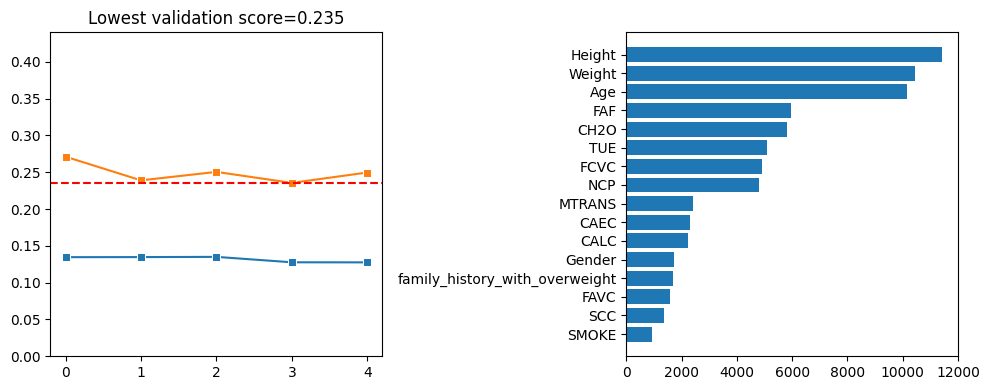

In [147]:
fig,axes=plt.subplots(nrows=1,ncols=2,figsize=(10,4))

axes=axes.flatten()

sns.lineplot(train_score,marker='s',ax=axes[0])
sns.lineplot(valid_score,marker='s',ax=axes[0])
axes[0].set_ylim(0,0.44)
axes[0].axhline(np.min(valid_score),linestyle='--',color='red')
axes[0].set_title(f'Lowest validation score={np.round(np.min(valid_score),3)}')

feature_importance_0=pd.DataFrame(feature_importance_0.groupby('Features')['Importance'].mean().reset_index())
feature_importance_0=feature_importance_0.sort_values(by='Importance',ascending=False)
axes[1].barh(feature_importance_0['Features'],feature_importance_0['Importance'])
plt.gca().invert_yaxis()
plt.tight_layout()

___**XGB model training using hyperparameters obtained from optimizatiing logloss using Bayesian optimization and cross_validation on preprocessing_2 dataset**___

In [148]:
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold

params= {'colsample_bytree': 0.41568143501025034, 'learning_rate': 0.06228536477594174, 'max_depth': 6.0, 'min_child_weight': 8.0, 'n_estimators': 480.0,
         'reg_alpha': 0.5976630304416811, 'reg_lambda': 1.0766306287774818, 'subsample': 0.8093273368262248}


cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

predictions_prob=np.zeros((len(X_test_2),7))
valid_oof_prob=np.zeros((len(X_train_2),7))
train_score=[]
valid_score=[]
feature_importance_1=pd.DataFrame()

params['n_estimators']=int(params['n_estimators'])
params['min_child_weight']=int(params['min_child_weight'])
params['max_depth']=int(params['max_depth'])

params_1=params.copy()
del params_1['n_estimators']
params_1['objective']='multi:softprob'
params_1['num_class']=7

for fold,(train_idx,valid_idx) in enumerate(cv.split(X_train_2,y_train)):
    
    training_set=xgb.DMatrix(X_train_2.iloc[train_idx],label=y_train.iloc[train_idx])
    validation_set=xgb.DMatrix(X_train_2.iloc[valid_idx],label=y_train.iloc[valid_idx])

    evals_result={}

    model=xgb.train(params_1,dtrain=training_set,num_boost_round=params['n_estimators'],
                   evals=[(training_set,'training_set'),(validation_set,'validation_set')],verbose_eval=300,evals_result=evals_result,early_stopping_rounds=50)

    train_score.append(evals_result['training_set']['mlogloss'][model.best_iteration-1])
    valid_score.append(evals_result['validation_set']['mlogloss'][model.best_iteration-1])

    valid_oof_prob[valid_idx]=model.predict(validation_set,iteration_range=(0,model.best_iteration))
    predictions_prob=predictions_prob+model.predict(xgb.DMatrix(X_test_2),iteration_range=(0,model.best_iteration))

    # feature importance
    fold_imp=pd.DataFrame()
    imp_dict=model.get_score(importance_type='weight')
    temp_imp=pd.DataFrame({'Features':model.get_score(importance_type='weight').keys(),'Importance':model.get_score(importance_type='weight').values()})
    fold_imp['Features']=pd.DataFrame({'Features':X_train_2.columns})
    fold_imp=fold_imp.merge(temp_imp,on='Features',how='left').fillna(0)
    fold_imp['Fold']=fold
    feature_importance_1=pd.concat([feature_importance_1,fold_imp],axis=0)

predictions_prob=predictions_prob/cv.n_splits
predictions_prob=predictions_prob/np.sum(predictions_prob,axis=1,keepdims=True)
predictions=np.argmax(predictions_prob,axis=1)
valid_oof_prob=valid_oof_prob/np.sum(valid_oof_prob,axis=1,keepdims=True)
valid_oof=np.argmax(valid_oof_prob,axis=1)

print('Avg Train Score',np.mean(train_score))
print('Avg valid Score',np.mean(valid_score))

print('accuracy_score- valid_oof',accuracy_score(y_train,valid_oof))
print('cohen_kappa_score- valid_oof',cohen_kappa_score(y_train,valid_oof))
print('logloss- valid_oof',log_loss(y_train,valid_oof_prob))

acc.append(accuracy_score(y_test,predictions))
cks.append(cohen_kappa_score(y_test,predictions,weights='quadratic'))
log.append(log_loss(y_test,predictions_prob))
model_name.append('XGB_Classifier')
config.append('XGB_lib_cvs_preprocessing_2_hyperopt_logloss')

predictions_1=predictions

[0]	training_set-mlogloss:1.83539	validation_set-mlogloss:1.83679
[300]	training_set-mlogloss:0.16110	validation_set-mlogloss:0.26934
[380]	training_set-mlogloss:0.14374	validation_set-mlogloss:0.27001
[0]	training_set-mlogloss:1.83507	validation_set-mlogloss:1.83550
[300]	training_set-mlogloss:0.16618	validation_set-mlogloss:0.24382
[454]	training_set-mlogloss:0.13671	validation_set-mlogloss:0.24161
[0]	training_set-mlogloss:1.83419	validation_set-mlogloss:1.83529
[300]	training_set-mlogloss:0.16572	validation_set-mlogloss:0.25267
[454]	training_set-mlogloss:0.13576	validation_set-mlogloss:0.25091
[0]	training_set-mlogloss:1.83398	validation_set-mlogloss:1.83554
[300]	training_set-mlogloss:0.16708	validation_set-mlogloss:0.23862
[441]	training_set-mlogloss:0.13984	validation_set-mlogloss:0.23689
[0]	training_set-mlogloss:1.83492	validation_set-mlogloss:1.83608
[300]	training_set-mlogloss:0.16602	validation_set-mlogloss:0.25017
[416]	training_set-mlogloss:0.14261	validation_set-mloglos

**Analysis:**
  - The training log loss decreased significantly from the initial to final stages, indicating effective learning and reduction in error.
  - The validation log loss reflects a consistent level of model confidence with a final average of 0.2490, indicating a reasonable prediction certainty.
  - The models achieved a high accuracy score of 91.62% and a strong Cohen's Kappa score of 0.9017, suggesting robust classification performance and strong agreement with actual labels.
  - The consistent log loss values across different stages suggest stable model performance with good generalization to unseen data.

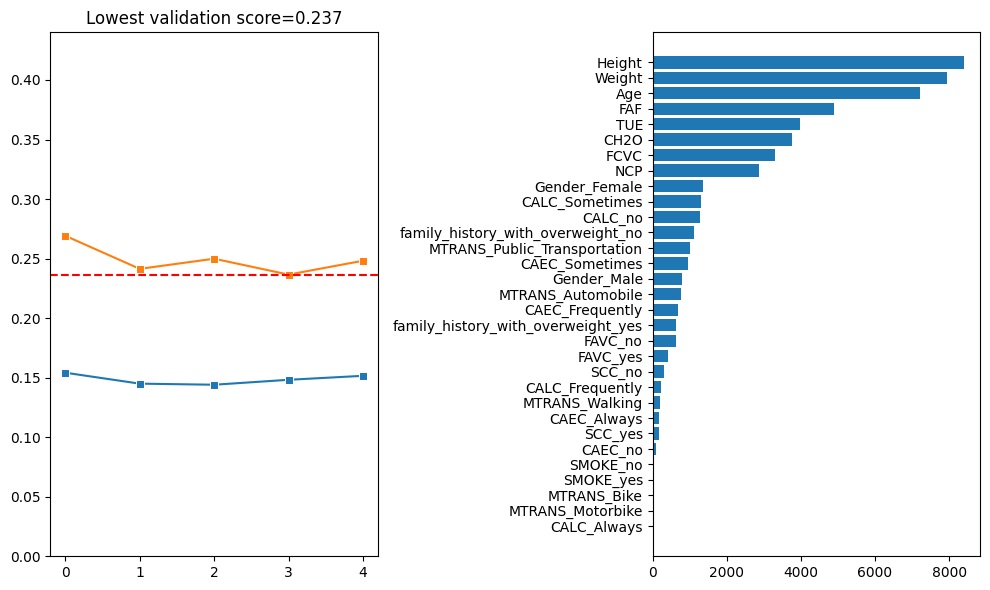

In [149]:
fig,axes=plt.subplots(nrows=1,ncols=2,figsize=(10,6))

axes=axes.flatten()

sns.lineplot(train_score,marker='s',ax=axes[0])
sns.lineplot(valid_score,marker='s',ax=axes[0])
axes[0].set_ylim(0,0.44)
axes[0].axhline(np.min(valid_score),linestyle='--',color='red')
axes[0].set_title(f'Lowest validation score={np.round(np.min(valid_score),3)}')

feature_importance_1=pd.DataFrame(feature_importance_1.groupby('Features')['Importance'].mean().reset_index())
feature_importance_1=feature_importance_1.sort_values(by='Importance',ascending=False)
axes[1].barh(feature_importance_1['Features'],feature_importance_1['Importance'])
plt.gca().invert_yaxis()
plt.tight_layout()

___**LGB model training using hyperparameters obtained from optimizating accuracy using Optuna optimization and cross_validation on preprocessing_2 dataset**___

In [150]:
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold

params= {'n_estimators': 632, 'max_depth': 6, 'learning_rate': 0.022701691754910897,
         'colsample_bytree': 0.41967005293403287, 'subsample': 0.44062877619608154, 'reg_alpha': 1.5428773101442639, 'reg_lambda': 0.7946489009697298}


cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

predictions_prob=np.zeros((len(X_test_2),7))
valid_oof_prob=np.zeros((len(X_train_2),7))
train_score=[]
valid_score=[]
feature_importance_2=pd.DataFrame()

params['n_estimators']=int(params['n_estimators'])
#params['min_child_weight']=int(params['min_child_weight'])
#params['min_child_samples']=int(params['min_child_samples'])
params['max_depth']=int(params['max_depth'])

params_1=params.copy()
del params_1['n_estimators']
params_1['objective']='multiclass'
params_1['num_class']=7
params_1['early_stopping_rounds']=50
params_1['verbosity']=-1

for fold,(train_idx,valid_idx) in enumerate(cv.split(X_train_2,y_train)):
    
    training_set=lgb.Dataset(X_train_2.iloc[train_idx],label=y_train.iloc[train_idx])
    validation_set=lgb.Dataset(X_train_2.iloc[valid_idx],label=y_train.iloc[valid_idx])

    model=lgb.train(params_1,training_set,params['n_estimators'],
                   valid_sets=[training_set,validation_set])

    train_score.append(model.best_score['training']['multi_logloss'])
    valid_score.append(model.best_score['valid_1']['multi_logloss'])

    valid_oof_prob[valid_idx]=model.predict(X_train_2.iloc[valid_idx],num_iteration=model.best_iteration)
    predictions_prob=predictions_prob+model.predict(X_test_2,num_iteration=model.best_iteration)
    
    # feature importance
    fold_imp=pd.DataFrame()
    fold_imp['Features']=X_train_2.columns
    fold_imp['Importance']=model.feature_importance()
    fold_imp['Fold']=fold
    feature_importance_2=pd.concat([feature_importance_2,fold_imp],axis=0)

predictions_prob=predictions_prob/cv.n_splits
predictions_prob=predictions_prob/np.sum(predictions_prob,axis=1,keepdims=True)
predictions=np.argmax(predictions_prob,axis=1)
valid_oof_prob=valid_oof_prob/np.sum(valid_oof_prob,axis=1,keepdims=True)
valid_oof=np.argmax(valid_oof_prob,axis=1)

print('Avg Train Score',np.mean(train_score))
print('Avg valid Score',np.mean(valid_score))

print('accuracy_score- valid_oof',accuracy_score(y_train,valid_oof))
print('cohen_kappa_score- valid_oof',cohen_kappa_score(y_train,valid_oof))
print('logloss- valid_oof',log_loss(y_train,valid_oof_prob))

acc.append(accuracy_score(y_test,predictions))
cks.append(cohen_kappa_score(y_test,predictions,weights='quadratic'))
log.append(log_loss(y_test,predictions_prob))
model_name.append('LGB_Classifier')
config.append('LGB_lib_cvs_preprocessing_2_optuna_accuracy')

predictions_2=predictions

Avg Train Score 0.14203398238355291
Avg valid Score 0.24890254724149546
accuracy_score- valid_oof 0.9166119500984898
cohen_kappa_score- valid_oof 0.9022592425042024
logloss- valid_oof 0.24890368626670656


**Analysis:**
  - The average training log loss of 0.1420 indicates that the model has learned well from the training data, with relatively low error during training.
  - The average validation log loss of 0.2489 suggests that the model maintains a good level of prediction certainty on unseen data, with only moderate error.
  - An accuracy of 91.66% reflects high overall classification performance, demonstrating that the model correctly predicted the classes in the majority of cases.
  - A Cohen's Kappa score of 0.9023 shows a strong agreement between the predicted and actual classes, indicating that the model performs well in distinguishing between classes.
  - The validation log loss is close to the average log loss, indicating consistent performance across different metrics and a balanced model in terms of confidence and accuracy.

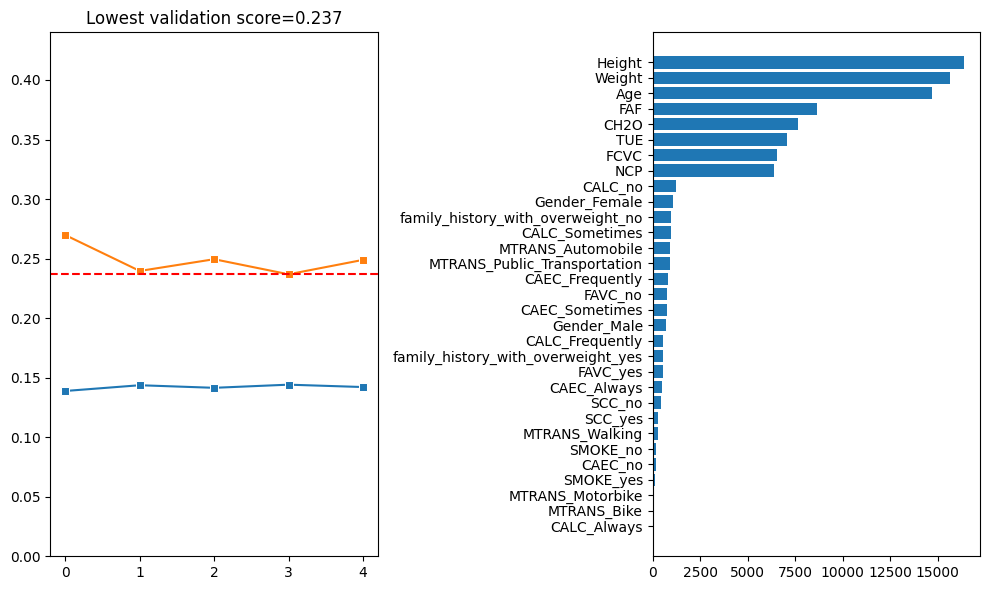

In [151]:
fig,axes=plt.subplots(nrows=1,ncols=2,figsize=(10,6))

axes=axes.flatten()

sns.lineplot(train_score,marker='s',ax=axes[0])
sns.lineplot(valid_score,marker='s',ax=axes[0])
axes[0].set_ylim(0,0.44)
axes[0].axhline(np.min(valid_score),linestyle='--',color='red')
axes[0].set_title(f'Lowest validation score={np.round(np.min(valid_score),3)}')

feature_importance_2=pd.DataFrame(feature_importance_2.groupby('Features')['Importance'].mean().reset_index())
feature_importance_2=feature_importance_2.sort_values(by='Importance',ascending=False)
axes[1].barh(feature_importance_2['Features'],feature_importance_2['Importance'])
plt.gca().invert_yaxis()
plt.tight_layout()

___**LGB model training using hyperparameters obtained from optimizating accuracy using Optuna optimization with no cross_validation on preprocessing_2 dataset**___

In [152]:
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold

params={'n_estimators': 417, 'max_depth': 7, 'learning_rate': 0.08000874397938304, 
        'colsample_bytree': 0.4800383182955504, 'subsample': 0.590135315806615, 'reg_alpha': 2.1743997172882716, 'reg_lambda': 2.001658609833063}

cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

predictions_prob=np.zeros((len(X_test_2),7))
valid_oof_prob=np.zeros((len(X_train_2),7))
train_score=[]
valid_score=[]
feature_importance_3=pd.DataFrame()

params['n_estimators']=int(params['n_estimators'])
#params['min_child_weight']=int(params['min_child_weight'])
#params['min_child_samples']=int(params['min_child_samples'])
params['max_depth']=int(params['max_depth'])

params_1=params.copy()
del params_1['n_estimators']
params_1['objective']='multiclass'
params_1['num_class']=7
params_1['early_stopping_rounds']=50
params_1['verbosity']=-1

for fold,(train_idx,valid_idx) in enumerate(cv.split(X_train_2,y_train)):
    
    training_set=lgb.Dataset(X_train_2.iloc[train_idx],label=y_train.iloc[train_idx])
    validation_set=lgb.Dataset(X_train_2.iloc[valid_idx],label=y_train.iloc[valid_idx])

    model=lgb.train(params_1,training_set,params['n_estimators'],
                   valid_sets=[training_set,validation_set])

    train_score.append(model.best_score['training']['multi_logloss'])
    valid_score.append(model.best_score['valid_1']['multi_logloss'])

    valid_oof_prob[valid_idx]=model.predict(X_train_2.iloc[valid_idx],num_iteration=model.best_iteration)
    predictions_prob=predictions_prob+model.predict(X_test_2,num_iteration=model.best_iteration)
    
    # feature importance
    fold_imp=pd.DataFrame()
    fold_imp['Features']=X_train_2.columns
    fold_imp['Importance']=model.feature_importance()
    fold_imp['Fold']=fold
    feature_importance_3=pd.concat([feature_importance_3,fold_imp],axis=0)

predictions_prob=predictions_prob/cv.n_splits
predictions_prob=predictions_prob/np.sum(predictions_prob,axis=1,keepdims=True)
predictions=np.argmax(predictions_prob,axis=1)
valid_oof_prob=valid_oof_prob/np.sum(valid_oof_prob,axis=1,keepdims=True)
valid_oof=np.argmax(valid_oof_prob,axis=1)

print('Avg Train Score',np.mean(train_score))
print('Avg valid Score',np.mean(valid_score))

print('accuracy_score- valid_oof',accuracy_score(y_train,valid_oof))
print('cohen_kappa_score- valid_oof',cohen_kappa_score(y_train,valid_oof))
print('logloss- valid_oof',log_loss(y_train,valid_oof_prob))

acc.append(accuracy_score(y_test,predictions))
cks.append(cohen_kappa_score(y_test,predictions,weights='quadratic'))
log.append(log_loss(y_test,predictions_prob))
model_name.append('LGB_Classifier')
config.append('LGB_lib_dir_preprocessing_2_optuna_accuracy')

predictions_3=predictions

Avg Train Score 0.14439224238951825
Avg valid Score 0.25096310021240453
accuracy_score- valid_oof 0.9158459181440141
cohen_kappa_score- valid_oof 0.9013609894237606
logloss- valid_oof 0.2509641905990428


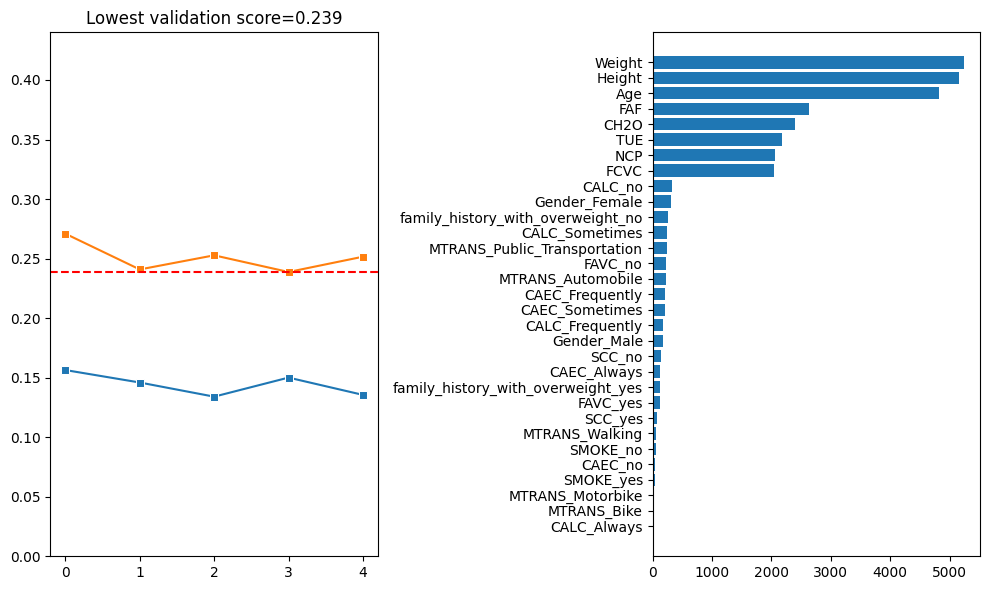

In [153]:
fig,axes=plt.subplots(nrows=1,ncols=2,figsize=(10,6))

axes=axes.flatten()

sns.lineplot(train_score,marker='s',ax=axes[0])
sns.lineplot(valid_score,marker='s',ax=axes[0])
axes[0].set_ylim(0,0.44)
axes[0].axhline(np.min(valid_score),linestyle='--',color='red')
axes[0].set_title(f'Lowest validation score={np.round(np.min(valid_score),3)}')

feature_importance_3=pd.DataFrame(feature_importance_3.groupby('Features')['Importance'].mean().reset_index())
feature_importance_3=feature_importance_3.sort_values(by='Importance',ascending=False)
axes[1].barh(feature_importance_3['Features'],feature_importance_3['Importance'])
plt.gca().invert_yaxis()
plt.tight_layout()

**Analysis:**
- The average training log loss of 0.1444 indicates that the model fits the training data with a reasonable level of error.
- The average validation log loss of 0.2510 shows a moderate error rate on unseen data, suggesting that while the model performs well, there is room for improvement.
- An accuracy of 91.58% reflects strong overall classification performance, with the model correctly predicting the classes in most cases.
- A Cohen's Kappa score of 0.9014 indicates very good agreement between the predicted and actual classes, highlighting effective classification.
- The validation log loss closely aligns with the average log loss, demonstrating consistency in the model’s predictive confidence and overall performance.

In [158]:
results=pd.DataFrame({'Model':model_name,'Configuration':config,'Accuracy_score':acc,'Logloss':log,'Cohen_kappa_score':cks})
results

,Model,Configuration,Accuracy_score,Logloss,Cohen_kappa_score
0,XGB_Classifier,XGB_lib_cvs_preprocessing_3_hyperopt_logloss,0.913986,0.244531,0.984344
1,XGB_Classifier,XGB_lib_cvs_preprocessing_2_hyperopt_logloss,0.916174,0.243821,0.985066
2,LGB_Classifier,LGB_lib_cvs_preprocessing_2_optuna_accuracy,0.915955,0.243923,0.984897
3,LGB_Classifier,LGB_lib_dir_preprocessing_2_optuna_accuracy,0.915518,0.244231,0.984685


In [181]:
predictions=[predictions_0,predictions_1,predictions_2,predictions_3]
for i,config in enumerate(results['Configuration']):
    print('\n',config)
    print('---------------------------------------------')
    print(classification_report(y_test,predictions[i]))


 XGB_lib_cvs_preprocessing_3_hyperopt_logloss
---------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.94      0.94       574
           1       0.89      0.90      0.89       677
           2       0.79      0.82      0.81       525
           3       0.83      0.82      0.83       536
           4       0.92      0.88      0.90       682
           5       0.97      0.97      0.97       697
           6       1.00      1.00      1.00       878

    accuracy                           0.91      4569
   macro avg       0.90      0.91      0.90      4569
weighted avg       0.91      0.91      0.91      4569


 XGB_lib_cvs_preprocessing_2_hyperopt_logloss
---------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.94      0.94       574
           1       0.90      0.90      0.90       677
           2       0.80      0.82      0.81       525


### **Analysis**
- the logloss has decreased for xgb preprocessing 3 from 0.273115 to 0.244531(tuned)
- The cohen_kappa_score has increased for xgb preprocessing 3 from 0.89895 to 0.98434(tuned)

- the logloss has decreased for xgb preprocessing 2 from 0.272454 to 0.243821(tuned)
- The cohen_kappa_score has increased for xgb preprocessing 3 from 0.89454 to 0.985066(tuned)

- the logloss has decreased for lgb preprocessing 2 from 0.268737 to 0.243923(tuned)
- The cohen_kappa_score has increased for lgb preprocessing 2 from 0.89813 to 0.98489(tuned)

### <u>**Model training using optimized hyperparameters directly using a single validation set**<u>

In [294]:
acc=[]
config=[]
log=[]
cks=[]
model_name=[]

In [295]:
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold

params= {'colsample_bytree': 0.5259358761810902, 'learning_rate': 0.07416531924132465, 'max_depth': 6.0, 'min_child_weight': 0.0,
  'n_estimators': 437.0, 'reg_alpha': 1.7168347661878087, 'reg_lambda': 0.74935100947915, 'subsample': 0.6504474010029635}



params['n_estimators']=int(params['n_estimators'])
params['min_child_weight']=int(params['min_child_weight'])
params['max_depth']=int(params['max_depth'])

params_1=params.copy()
del params_1['n_estimators']
params_1['objective']='multi:softprob'
params_1['num_class']=7

    
training_set=xgb.DMatrix(X_train_3,label=y_train)
validation_set=xgb.DMatrix(X_test_3,label=y_test)
model=xgb.train(params_1,dtrain=training_set,num_boost_round=params['n_estimators'],
                   evals=[(training_set,'training_set'),(validation_set,'validation_set')],verbose_eval=300,evals_result=evals_result,early_stopping_rounds=50)

y_predict_prob=model.predict(xgb.DMatrix(X_test_3),iteration_range=(0,model.best_iteration))
y_predict=np.argmax(y_predict_prob,axis=1)

acc.append(accuracy_score(y_test,y_predict))
cks.append(cohen_kappa_score(y_test,y_predict,weights='quadratic'))
log.append(log_loss(y_test,y_predict_prob))
model_name.append('XGB_Classifier_dir')
config.append('XGB_lib_cvs_preprocessing_3_hyperopt_logloss')

[0]	training_set-mlogloss:1.81959	validation_set-mlogloss:1.82207
[300]	training_set-mlogloss:0.14360	validation_set-mlogloss:0.24373
[374]	training_set-mlogloss:0.12676	validation_set-mlogloss:0.24384


In [296]:
import xgboost as xgb
from sklearn.model_selection import StratifiedKFold

params= {'colsample_bytree': 0.41568143501025034, 'learning_rate': 0.06228536477594174, 'max_depth': 6.0, 'min_child_weight': 8.0, 'n_estimators': 480.0,
         'reg_alpha': 0.5976630304416811, 'reg_lambda': 1.0766306287774818, 'subsample': 0.8093273368262248}




params['n_estimators']=int(params['n_estimators'])
params['min_child_weight']=int(params['min_child_weight'])
params['max_depth']=int(params['max_depth'])

params_1=params.copy()
del params_1['n_estimators']
params_1['objective']='multi:softprob'
params_1['num_class']=7

    
training_set=xgb.DMatrix(X_train_2,label=y_train)
validation_set=xgb.DMatrix(X_test_2,label=y_test)
model=xgb.train(params_1,dtrain=training_set,num_boost_round=params['n_estimators'],
                   evals=[(training_set,'training_set'),(validation_set,'validation_set')],verbose_eval=300,evals_result=evals_result,early_stopping_rounds=50)

y_predict_prob=model.predict(xgb.DMatrix(X_test_2),iteration_range=(0,model.best_iteration))
y_predict=np.argmax(y_predict_prob,axis=1)

acc.append(accuracy_score(y_test,y_predict))
cks.append(cohen_kappa_score(y_test,y_predict,weights='quadratic'))
log.append(log_loss(y_test,y_predict_prob))
model_name.append('XGB_Classifier_dir')
config.append('XGB_lib_cvs_preprocessing_2_hyperopt_logloss')


[0]	training_set-mlogloss:1.83452	validation_set-mlogloss:1.83654
[300]	training_set-mlogloss:0.16986	validation_set-mlogloss:0.24678
[432]	training_set-mlogloss:0.14499	validation_set-mlogloss:0.24467


In [297]:
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold

params= {'n_estimators': 632, 'max_depth': 6, 'learning_rate': 0.022701691754910897,
         'colsample_bytree': 0.41967005293403287, 'subsample': 0.44062877619608154, 'reg_alpha': 1.5428773101442639, 'reg_lambda': 0.7946489009697298}


cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)


params['n_estimators']=int(params['n_estimators'])
#params['min_child_weight']=int(params['min_child_weight'])
#params['min_child_samples']=int(params['min_child_samples'])
params['max_depth']=int(params['max_depth'])

params_1=params.copy()
del params_1['n_estimators']
params_1['objective']='multiclass'
params_1['num_class']=7
params_1['early_stopping_rounds']=50
params_1['verbosity']=-1

    
training_set=lgb.Dataset(X_train_2,label=y_train)
validation_set=lgb.Dataset(X_test_2,label=y_test)

model=lgb.train(params_1,training_set,params['n_estimators'],
                   valid_sets=[training_set,validation_set])


y_predict_prob=model.predict(X_test_2,num_iteration=model.best_iteration)
y_predict=np.argmax(y_predict_prob,axis=1)

acc.append(accuracy_score(y_test,y_predict))
cks.append(cohen_kappa_score(y_test,y_predict,weights='quadratic'))
log.append(log_loss(y_test,y_predict_prob))
model_name.append('LGB_Classifier_dir')
config.append('LGB_lib_cvs_preprocessing_2_optuna_accuracy')


In [298]:

import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold

params={'n_estimators': 417, 'max_depth': 7, 'learning_rate': 0.08000874397938304, 
        'colsample_bytree': 0.4800383182955504, 'subsample': 0.590135315806615, 'reg_alpha': 2.1743997172882716, 'reg_lambda': 2.001658609833063}




params['n_estimators']=int(params['n_estimators'])
#params['min_child_weight']=int(params['min_child_weight'])
#params['min_child_samples']=int(params['min_child_samples'])
params['max_depth']=int(params['max_depth'])

params_1=params.copy()
del params_1['n_estimators']
params_1['objective']='multiclass'
params_1['num_class']=7
params_1['early_stopping_rounds']=50
params_1['verbosity']=-1

    
training_set=lgb.Dataset(X_train_2,label=y_train)
validation_set=lgb.Dataset(X_test_2,label=y_test)

model=lgb.train(params_1,training_set,params['n_estimators'],
                   valid_sets=[training_set,validation_set])


y_predict_prob=model.predict(X_test_2,num_iteration=model.best_iteration)
y_predict=np.argmax(y_predict_prob,axis=1)

acc.append(accuracy_score(y_test,y_predict))
cks.append(cohen_kappa_score(y_test,y_predict,weights='quadratic'))
log.append(log_loss(y_test,y_predict_prob))
model_name.append('LGB_Classifier_dir')
config.append('LGB_lib_dir_preprocessing_2_optuna_accuracy')



In [299]:
results_direct_model_training=pd.DataFrame({'Model':model_name,'Configuration':config,'Accuracy_score':acc,'Logloss':log,'Cohen_kappa_score':cks})
results_direct_model_training

,Model,Configuration,Accuracy_score,Logloss,Cohen_kappa_score
0,XGB_Classifier_dir,XGB_lib_cvs_preprocessing_3_hyperopt_logloss,0.914642,0.243602,0.984225
1,XGB_Classifier_dir,XGB_lib_cvs_preprocessing_2_hyperopt_logloss,0.916393,0.244015,0.985027
2,LGB_Classifier_dir,LGB_lib_cvs_preprocessing_2_optuna_accuracy,0.915299,0.244946,0.984434
3,LGB_Classifier_dir,LGB_lib_dir_preprocessing_2_optuna_accuracy,0.919019,0.244476,0.985090


**Comparative Inference:**

- The highest accuracy score is observed with the non-CVS LGB model (0.919019) and the CVS XGB model (0.916174). This suggests that, generally, the models trained with CVS performed similarly in terms of accuracy compared to some non-CVS models.
Logloss:

- For Logloss, the lowest value is seen in the CVS XGB model with configuration XGB_lib_cvs_preprocessing_2_hyperopt_logloss (0.243821), indicating better performance in predicting probabilities close to the true values. The non-CVS models show slightly higher Logloss values.
Cohen's Kappa Score:

- The highest Cohen's Kappa Score is observed with the non-CVS LGB model (0.985090) and the CVS XGB model (0.985066). This indicates a similar level of agreement between predicted and observed classes, regardless of using CVS or non-CVS.

### <u>**Oversampling the dataset**<u>

*Baseline validation of oversampled dataset using Random Forest Classifier*

In [278]:
from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from imblearn.combine import SMOTEENN, SMOTETomek
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
import numpy as np

resampling_methods = {
    'SMOTE': SMOTE(random_state=42),
    'ADASYN': ADASYN(random_state=42),
    'RandomOverSampler': RandomOverSampler(random_state=42),
    'RandomUnderSampler': RandomUnderSampler(random_state=42),
    'NearMiss': NearMiss(),
    'SMOTEENN': SMOTEENN(random_state=42),
    'SMOTETomek': SMOTETomek(random_state=42)
}

method_names=[]
accuracy_scores=[]
f1_scores=[]

X, y = X_train_2, y_train  # Your training data

for method_name, resampler in resampling_methods.items():
    X_resampled, y_resampled = resampler.fit_resample(X, y)
    model = RandomForestClassifier(random_state=42)
    model.fit(X_resampled,y_resampled)
    y_predict=model.predict(X_test_2)
    method_names.append(method_name)
    accuracy_scores.append(accuracy_score(y_test,y_predict))
    f1_scores.append(f1_score(y_test,y_predict,average='macro'))


In [280]:
results=pd.DataFrame({'Method':method_names,'Accuracy_score':accuracy_scores,'F1_score':f1_scores})
results

,Method,Accuracy_score,F1_score
0,SMOTE,0.893850,0.882547
1,ADASYN,0.898884,0.887968
2,RandomOverSampler,0.895382,0.884233
3,RandomUnderSampler,0.893412,0.882391
4,NearMiss,0.890348,0.879277
5,SMOTEENN,0.878529,0.866102
6,SMOTETomek,0.892537,0.880820


*Baseline validation of oversampled dataset using XGB Classifier*

In [281]:
from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from imblearn.combine import SMOTEENN, SMOTETomek
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
import numpy as np

resampling_methods = {
    'SMOTE': SMOTE(random_state=42),
    'ADASYN': ADASYN(random_state=42),
    'RandomOverSampler': RandomOverSampler(random_state=42),
    'RandomUnderSampler': RandomUnderSampler(random_state=42),
    'NearMiss': NearMiss(),
    'SMOTEENN': SMOTEENN(random_state=42),
    'SMOTETomek': SMOTETomek(random_state=42)
}

method_names=[]
accuracy_scores=[]
f1_scores=[]

X, y = X_train_2, y_train  # Your training data

for method_name, resampler in resampling_methods.items():
    X_resampled, y_resampled = resampler.fit_resample(X, y)
    model = xgb.XGBClassifier(random_state=42)
    model.fit(X_resampled,y_resampled)
    y_predict=model.predict(X_test_2)
    method_names.append(method_name)
    accuracy_scores.append(accuracy_score(y_test,y_predict))
    f1_scores.append(f1_score(y_test,y_predict,average='macro'))


In [282]:
results=pd.DataFrame({'Method':method_names,'Accuracy_score':accuracy_scores,'F1_score':f1_scores})
results

,Method,Accuracy_score,F1_score
0,SMOTE,0.909170,0.899728
1,ADASYN,0.908514,0.899003
2,RandomOverSampler,0.910703,0.901617
3,RandomUnderSampler,0.912672,0.903750
4,NearMiss,0.906106,0.896880
5,SMOTEENN,0.896039,0.885190
6,SMOTETomek,0.908076,0.898417


*Baseline validation of oversampled dataset using LGB Classifier*

In [284]:

from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from imblearn.combine import SMOTEENN, SMOTETomek
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
import numpy as np

resampling_methods = {
    'SMOTE': SMOTE(random_state=42),
    'ADASYN': ADASYN(random_state=42),
    'RandomOverSampler': RandomOverSampler(random_state=42),
    'RandomUnderSampler': RandomUnderSampler(random_state=42),
    'NearMiss': NearMiss(),
    'SMOTEENN': SMOTEENN(random_state=42),
    'SMOTETomek': SMOTETomek(random_state=42)
}

method_names=[]
accuracy_scores=[]
f1_scores=[]

X, y = X_train_2, y_train  # Your training data

for method_name, resampler in resampling_methods.items():
    X_resampled, y_resampled = resampler.fit_resample(X, y)
    model = lgb.LGBMClassifier(random_state=42,verbosity=-1)
    model.fit(X_resampled,y_resampled)
    y_predict=model.predict(X_test_2)
    method_names.append(method_name)
    accuracy_scores.append(accuracy_score(y_test,y_predict))
    f1_scores.append(f1_score(y_test,y_predict,average='macro'))


In [285]:
results=pd.DataFrame({'Method':method_names,'Accuracy_score':accuracy_scores,'F1_score':f1_scores})
results

,Method,Accuracy_score,F1_score
0,SMOTE,0.909170,0.899848
1,ADASYN,0.913329,0.904154
2,RandomOverSampler,0.911797,0.902744
3,RandomUnderSampler,0.911359,0.902126
4,NearMiss,0.907420,0.898272
5,SMOTEENN,0.891661,0.880557
6,SMOTETomek,0.910046,0.900775


In [293]:
# lgb-preprocessing_2 hyperparameter optimization (logloss) by cross_validation on resampled dataset 
# using ADASYN that should notable improvements in baseline score upon resampling the dataset 

from hyperopt import tpe,hp,fmin,Trials,STATUS_OK
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss, cohen_kappa_score
import xgboost as xgb
import numpy as np


sampler=ADASYN(random_state=42)
X_resampled, y_resampled = resampler.fit_resample(X_train_2, y_train)

cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

space={
    
    'n_estimators':hp.quniform('n_estimators',400,700,3),
    'max_depth':hp.quniform('max_depth',4,18,3),
    #'min_child_weight':hp.quniform('min_child_weight',0,20,3),
    #'min_child_samples':hp.quniform('min_child_samples',10,100,3),
    'learning_rate':hp.uniform('learning_rate',0.01,0.3),
    'colsample_bytree':hp.uniform('colsample_bytree',0.4,1),
    'subsample':hp.uniform('subsample',0.4,1),
    'lambda_l1':hp.uniform('reg_alpha',0,2.5),
    'lambda_l2':hp.uniform('reg_lambda',0,2.5),
    'num_class':7,
    'objective':'multiclass',
    'early_stopping_rounds':50,
    'verbosity':-1
}    
       

logloss=[]
cks=[]


def objective_fn(params):
    
    params['n_estimators']=int(params['n_estimators'])
    #params['min_child_weight']=int(params['min_child_weight'])
    params['max_depth']=int(params['max_depth'])



    training_set=lgb.Dataset(X_resampled,label=y_resampled)
    validation_set=lgb.Dataset(X_test_2,label=y_test)

        
    params_1=params.copy()
    del params_1['n_estimators']
        
    model=lgb.train(params_1,training_set,params['n_estimators'],valid_sets=[training_set,validation_set])

    y_predict_prob=model.predict(X_test_2,num_iteration=model.best_iteration)
    y_predict=np.argmax(y_predict_prob,axis=1)
    
    logloss.append(log_loss(y_test,y_predict_prob))
    cks.append(cohen_kappa_score(y_test,y_predict))
        
    score=log_loss(y_test,y_predict_prob)
    
    return {'loss': score, 'status': STATUS_OK}

trials=Trials()
best_1=fmin(fn=objective_fn,trials=trials,algo=tpe.suggest,max_evals=150,rstate=np.random.default_rng(42),space=space)
print('The best hyperparameters found for the dataset based on logloss is:', best_1) 


100%|██████████| 150/150 [14:38<00:00,  5.86s/trial, best loss: 0.24926329041523348]
The best hyperparameters found for the dataset based on logloss is: {'colsample_bytree': 0.4472171269996787, 'learning_rate': 0.06346917182329109, 'max_depth': 18.0, 'n_estimators': 534.0, 'reg_alpha': 0.7906305721434758, 'reg_lambda': 0.566821705331757, 'subsample': 0.5906011718101628}


In [301]:
# training the model using the optimized hyperparameter
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold

params={'colsample_bytree': 0.4472171269996787, 'learning_rate': 0.06346917182329109,
        'max_depth': 18.0, 'n_estimators': 534.0, 'reg_alpha': 0.7906305721434758, 'reg_lambda': 0.566821705331757, 'subsample': 0.5906011718101628}

params['n_estimators']=int(params['n_estimators'])
#params['min_child_weight']=int(params['min_child_weight'])
#params['min_child_samples']=int(params['min_child_samples'])
params['max_depth']=int(params['max_depth'])

params_1=params.copy()
del params_1['n_estimators']
params_1['objective']='multiclass'
params_1['num_class']=7
params_1['early_stopping_rounds']=50
params_1['verbosity']=-1

    
training_set=lgb.Dataset(X_train_2,label=y_train)
validation_set=lgb.Dataset(X_test_2,label=y_test)

model=lgb.train(params_1,training_set,params['n_estimators'],
                   valid_sets=[training_set,validation_set])


y_predict_prob=model.predict(X_test_2,num_iteration=model.best_iteration)
y_predict=np.argmax(y_predict_prob,axis=1)

print('LGB_Classifier_dir_resampled')
print('Accuracy_score-:',accuracy_score(y_test,y_predict))
print('Cohen_Kappa_Score-:',cohen_kappa_score(y_test,y_predict,weights='quadratic'))
print('Logloss-:',log_loss(y_test,y_predict_prob))


LGB_Classifier_dir_resampled
Accuracy_score-: 0.916174217553075
Cohen_Kappa_Score-: 0.9849858182478903
Logloss-: 0.2434211572139918


### Model Performance Analysis

Oversampling had no notable effect on model performance, indicating that the model's tendency to prioritize classes 0, 1, 5, and 6 could be due to complex non-linear relationships among the features that are not being fully captured. Additionally, the overall low variability among the data values corresponding to these classes may contribute to this observation. To improve model performance, it is crucial to address potential overfitting, which can be achieved by:

- Handling any multicollinearity
- Reducing the model's bias towards majority classes

In both models, height, weight, and age are deemed more important by the model, leading to a higher prioritization of these features over others. Upon closely observing the KDE plot of numerical features (weight, height, and age) with the hue set as the dependent variable, it can be noticed that classes 2, 3, and 4 show the least overall variability, with crowding over one another. This indicates that the model's prioritization potentially reduces further exploration of these classes through other features.

If planning to introduce new features, it is important to focus on features that could potentially bring variability to these classes and hold better relevance or prioritization. Feature engineering using existing highly important features would be a more sensible approach.

An overall improvement in agreement between test values and predicted values is observed, as indicated by the increase in Cohen's kappa score for the best-performing model, `XGBClassifier`, from 0.898130 during baseline performance to 0.985090. This suggests a significant reduction in overfitting towards the known data. However, the Cohen's kappa score calculated on out-of-fold predicted values obtained during cross-validation was lower, at 0.902, compared to the score on unseen data, reflecting the model's generalization performance.


### __<u>**CLUSTERING**<u>__

[153951.04304918903, 138655.93053428395, 125575.48558465927, 115778.96330280266, 107939.85866364522, 102393.76737209366, 97085.50423327097, 93983.86769850625, 90721.28910367066]
[0.14764003115664034, 0.1368276338987411, 0.15580078448344528, 0.15140946566793367, 0.15722074472283284, 0.1654241363574837, 0.1718326303695797, 0.17604004203888668, 0.17988188689845924]


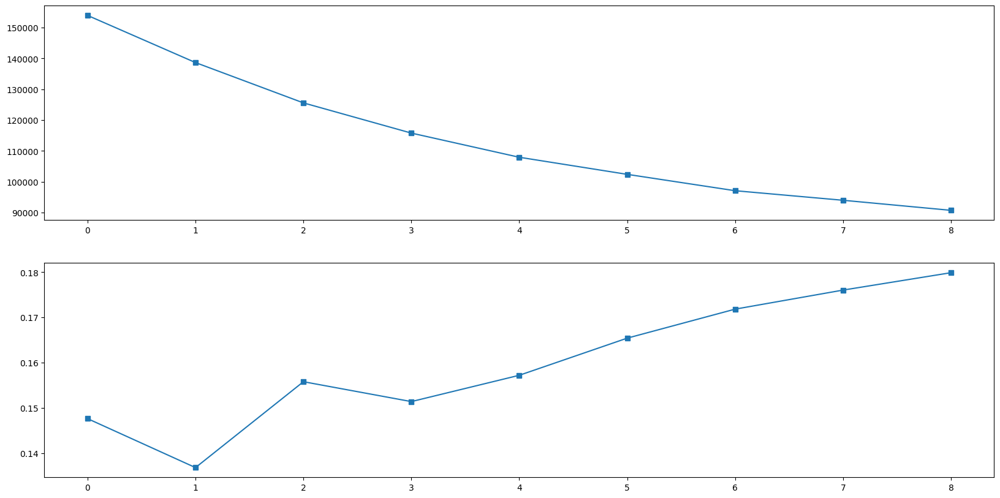

In [677]:
# clustering data values using preprocessing_1 dataset

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

wcss=[]
s_scores=[]

for i in range(2,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(X_train_1)
    wcss.append(kmeans.inertia_)
    s_scores.append(silhouette_score(X_train_1,kmeans.labels_))
print(wcss)
print(s_scores)

fig,axes=plt.subplots(nrows=2,ncols=1,figsize=(20,10))
axes=axes.flatten()
for i,score in enumerate([wcss,s_scores]):
    axes[i].plot(score,marker='s')
    


In [678]:
print(np.diff(wcss))
print(np.diff(s_scores))

[-15295.11251491 -13080.44494962  -9796.52228186  -7839.10463916
  -5546.09129155  -5308.26313882  -3101.63653476  -3262.57859484]
[-0.0108124   0.01897315 -0.00439132  0.00581128  0.00820339  0.00640849
  0.00420741  0.00384184]


### Inference

- A significant decrease in the Within-Cluster Sum of Squares (WCSS) is observed up to 6 clusters, beyond which the rate of decrease tends to diminish. This suggests that adding more clusters beyond 7 does not result in a notable improvement in cluster quality.

Based on silhouette scores:
- The first relatively high score is achieved at 4 clusters but increases significantly after a small drop from that point.
- The increase in silhouette scores plateaus from clusters 7 to 10.

- For a complex model, it is suggested to use 7 clusters based on the silhouette score. However, considering both the WCSS and silhouette scores, using 6 clusters is recommended.

- As the number of clusters increases, there is a potential risk of overfitting to the cluster segments. This overfitting may result in clusters that are too specific due to underlying ill-informative noise. The main purpose of a well-tuned model is to capture as many underlying structures and patterns in the entire dataset as possible. Creating too few clusters can lead to overgeneralization, where important distinctions are not adequately captured. Thus, a balance between the number of clusters must be maintained based on a thorough understanding of the predictive modeling objectives.


[158032.61257705698, 142772.28757934406, 130185.82563327265, 121151.3666014214, 114228.29449634699, 106197.39499535711, 103565.54695576536, 98310.51027628777, 95015.82167144696]
[0.14737566796676974, 0.1647888007046446, 0.15249049673670156, 0.1529203741308764, 0.15761468787803526, 0.15869526990808885, 0.1590836576859271, 0.16780748592977843, 0.17337886589465645]


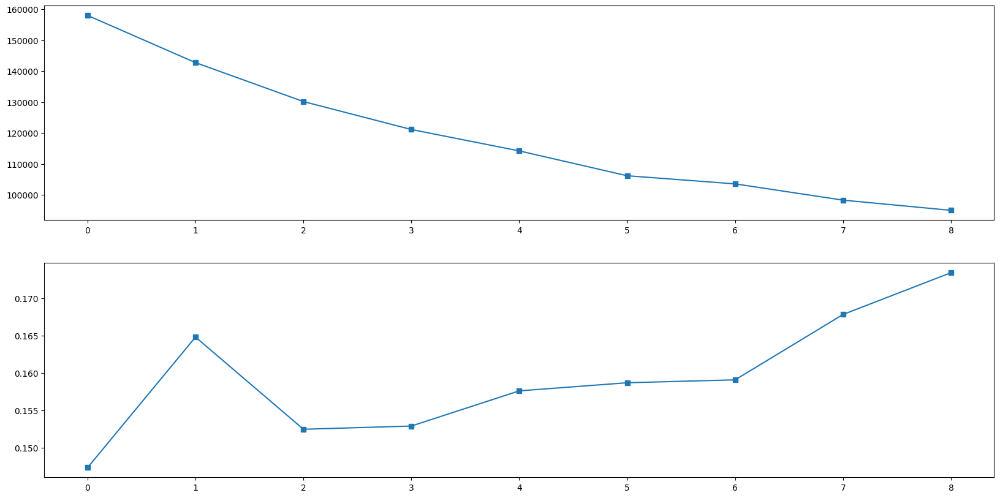

In [679]:
# clustering data values using preprocessing_2 dataset

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

wcss=[]
s_scores=[]

for i in range(2,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(X_train_2)
    wcss.append(kmeans.inertia_)
    s_scores.append(silhouette_score(X_train_2,kmeans.labels_))
print(wcss)
print(s_scores)

fig,axes=plt.subplots(nrows=2,ncols=1,figsize=(20,10))
axes=axes.flatten()
for i,score in enumerate([wcss,s_scores]):
    axes[i].plot(score,marker='s')
    


In [680]:
print(np.diff(wcss))
print(np.diff(s_scores))

[-15260.32499771 -12586.46194607  -9034.45903185  -6923.07210507
  -8030.89950099  -2631.84803959  -5255.03667948  -3294.68860484]
[ 0.01741313 -0.0122983   0.00042988  0.00469431  0.00108058  0.00038839
  0.00872383  0.00557138]


### Inference

Upon observing the Within-Cluster Sum of Squares (WCSS), a significant decrease can be seen up to 7 clusters, beyond which the rate of decrease tends to diminish. This indicates that adding more clusters beyond 7 does not result in a notable improvement in clustering quality.

Based on silhouette scores:
- The first relatively high score is achieved with 3 clusters but increases significantly after a small drop from 4 clusters onwards.
- The increase in silhouette scores plateaus from 9 to 10 clusters.

- For a complex model, it is suggested to use 9 clusters based on the silhouette score. However, considering both WCSS and silhouette scores, using 7 clusters is recommended.

- As the number of clusters increases, there is a potential risk of overfitting to the cluster segments. This overfitting may result in clusters that are too specific due to underlying ill-informative noise. The main purpose of a well-tuned model is to capture as many underlying structures and patterns in the entire dataset as possible. Creating too few clusters can lead to overgeneralization, where important distinctions are not adequately captured. Thus, a balance between the number of clusters must be maintained based on a thorough understanding of the objectives of predictive modeling.


[164028.56041195782, 146400.84795142704, 135154.43543374224, 127384.0967276019, 117577.04764575785, 112788.7333101395, 105643.9094987941, 101439.20364647571, 97466.4285834826]
[0.2338041478308337, 0.16034735787800758, 0.15851292096590364, 0.13490660086336606, 0.15176073342317672, 0.15345472418318676, 0.17265634200875238, 0.1737863371311804, 0.1760459440930764]


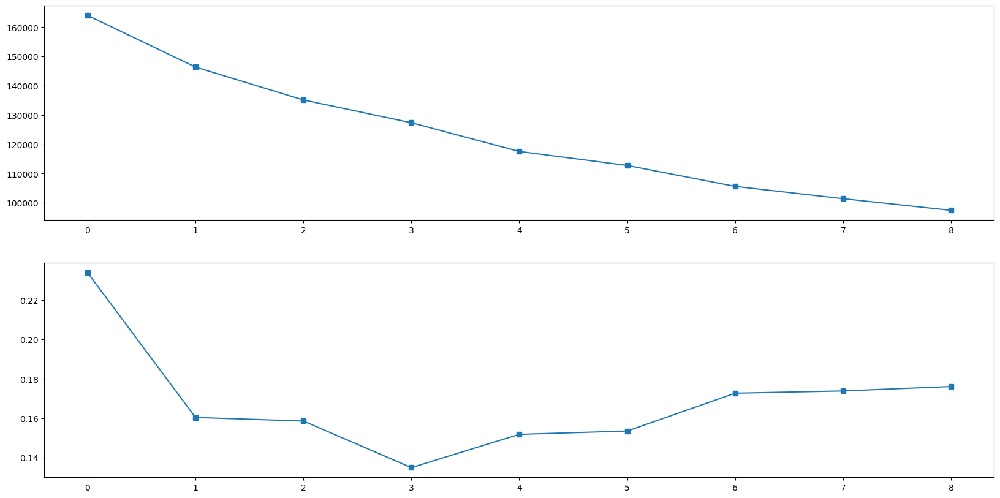

In [681]:
# clustering data values using preprocessing_3 dataset

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

wcss=[]
s_scores=[]

for i in range(2,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(X_train_3)
    wcss.append(kmeans.inertia_)
    s_scores.append(silhouette_score(X_train_3,kmeans.labels_))
print(wcss)
print(s_scores)

fig,axes=plt.subplots(nrows=2,ncols=1,figsize=(20,10))
axes=axes.flatten()
for i,score in enumerate([wcss,s_scores]):
    axes[i].plot(score,marker='s')
 
    


In [682]:
print(np.diff(wcss))
print(np.diff(s_scores))

[-17627.71246053 -11246.41251768  -7770.33870614  -9807.04908184
  -4788.31433562  -7144.82381135  -4204.70585232  -3972.77506299]
[-0.07345679 -0.00183444 -0.02360632  0.01685413  0.00169399  0.01920162
  0.00113     0.00225961]


### Inference

The most significant decrease in the Within-Cluster Sum of Squares (WCSS) occurs between 2 and 4 clusters, after which the decrease rate plateaus. A further significant decrease is observed up to 6 clusters, suggesting that using 5 or 6 clusters would be ideal for defining the features within the dataset. Beyond this number, the returns diminish.

Based on silhouette scores:
- The highest score is observed at 2 clusters, with another peak at 10 clusters.
- A significant increase in silhouette scores is noted from clusters 7 to 10.

- For a more complex model, it is recommended to use 9 clusters. However, if the model is simpler, 5 or 6 clusters would be sufficient. Considering both WCSS and silhouette scores, 6 clusters are recommended.

- As the number of clusters increases, there is a potential risk of overfitting to the cluster segments. This overfitting may result in clusters that are overly specific due to underlying ill-informative noise. A well-tuned model aims to capture as many underlying structures and patterns in the entire dataset as possible. Too few clusters may lead to overgeneralization, where important distinctions are not adequately captured. Therefore, a balance must be maintained based on a thorough understanding of the objectives of predictive modeling.


*Adding new feature (cluster) for all training_sets and using kprototypes for Clustering*

In [170]:
data_org['BMI']=data_org['Weight']/(data_org['Height'])**2
data_org['BMI_bin']=pd.cut(data_org['BMI'],bins=[(data['BMI'].min()-1),18.5,25,30,35,40,45,(data['BMI'].max()+1)],
                       labels=['Insufficient_Weight','Normal_Weight', 'Overweight_Level_I','Overweight_Level_II',
                              'Obesity_Type_I','Obesity_Type_II','Obesity_Type_III'])
data_org['Health']=data_org['BMI_bin'].apply(lambda x: 'Obese' if x in ['Overweight_Level_II','Obesity_Type_III', 'Obesity_Type_II', 'Overweight_Level_I',
       'Obesity_Type_I'] else 'UnderWeight' if x=='Insufficient_Weight' else 'Healthy')
data_org.drop_duplicates(inplace=True)
data_m=pd.concat([data,data_org],axis=0)
data_model=data_m.drop(['Health','BMI_bin','NObeyesdad_en','BMI'],axis=1)

#data_model=data_model.drop(['Health','BMI_bin'],axis=1)
# identifying potential ordinal and nonordinal categorical variables
bin=[]
for i in data_model.columns:
    if data_model[i].dtype=='object':
        if data_model[i].nunique()==2:
            bin.append(i)
        else:
            print(i,'--------',data_m[i].nunique())
            print('------------------------------------')
            print('values--','\n',data_m[i].unique(),'\n\n')


bin_data=data_model[bin]
ordinal_data=data_model[['CAEC','CALC']]
non_ord_data=data[['MTRANS']]
target_data=data_model[['NObeyesdad']]
num_data=data[['Age', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE','Height','Weight']]
data_model['NObeyesdad']=data_model['NObeyesdad'].replace({'Overweight_Level_II':3, 'Normal_Weight':1, 'Insufficient_Weight':0,
       'Obesity_Type_III':6, 'Obesity_Type_II':5, 'Overweight_Level_I':2,
       'Obesity_Type_I':4})   
X=data_model.drop(['NObeyesdad'],axis=1)
y=data_model['NObeyesdad']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
X_train = X_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)


# preprocesing_1
#ordinal_encoding
from sklearn.preprocessing import OrdinalEncoder
encoder=OrdinalEncoder()
X_train_1=X_train.copy()
X_test_1=X_test.copy()
X_train_1[ordinal_data.columns]=encoder.fit_transform(X_train[ordinal_data.columns])
X_test_1[ordinal_data.columns]=encoder.transform(X_test[ordinal_data.columns])

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from category_encoders import BinaryEncoder
numerical_transformer=Pipeline(steps=[('scaler',StandardScaler())])
non_ordinal_transformer=Pipeline(steps=[('encoder',OneHotEncoder(handle_unknown='ignore'))])
bin_transformer=Pipeline(steps=[('encoder',BinaryEncoder(handle_unknown='ignore'))])
preprocessor_1=ColumnTransformer(transformers=[('num',numerical_transformer,num_data.columns),
                                            ('non_ord',non_ordinal_transformer,non_ord_data.columns),
                                              ('bin',bin_transformer,bin_data.columns)],
                              remainder='passthrough')
pipeline_1=Pipeline(steps=[('preprocessor_1',preprocessor_1)])

X_train_1=pd.DataFrame(pipeline_1.fit_transform(X_train_1),index=X_train.index,columns=pipeline_1.named_steps['preprocessor_1'].get_feature_names_out())
X_test_1=pd.DataFrame(pipeline_1.transform(X_test_1),index=X_test.index,columns=pipeline_1.named_steps['preprocessor_1'].get_feature_names_out())


# preprocessing_2 GET DUMMIES
all_cat_data=data[((non_ord_data.columns).append(bin_data.columns)).append(ordinal_data.columns)]

from sklearn.preprocessing import StandardScaler
X_train_2=X_train.copy()
X_test_2=X_test.copy()

# scaling
X_train_2[num_data.columns]=scaler.fit_transform(X_train_2[num_data.columns])
X_test_2[num_data.columns]=scaler.transform(X_test_2[num_data.columns])

X_train_2=pd.DataFrame(X_train_2,index=X_train.index,columns=X_train_2.columns)
X_test_2=pd.DataFrame(X_test_2,index=X_test.index,columns=X_test_2.columns)


X_temp=pd.concat([X_train_2,X_test_2],axis=0,keys=['train','test'])
X_temp=pd.get_dummies(X_temp,columns=all_cat_data.columns)
X_train_2=X_temp.xs('train')
X_test_2=X_temp.xs('test')



# preprocessing_3 target encoding
all_cat_data=data[((non_ord_data.columns).append(bin_data.columns)).append(ordinal_data.columns)]
from category_encoders import TargetEncoder
from sklearn.preprocessing import StandardScaler
X_train_3=X_train.copy()
X_test_3=X_test.copy()
scaler=StandardScaler()
encoder=TargetEncoder(cols=all_cat_data.columns,smoothing=0.3)

# scaling
X_train_3[num_data.columns]=scaler.fit_transform(X_train_3[num_data.columns])
X_test_3[num_data.columns]=scaler.transform(X_test_3[num_data.columns])

# encoding
X_train_3[all_cat_data.columns]=encoder.fit_transform(X_train_3[all_cat_data.columns],y_train)
X_test_3[all_cat_data.columns]=encoder.transform(X_test_3[all_cat_data.columns])

X_train_3=pd.DataFrame(X_train_3,index=X_train.index,columns=X_train_3.columns)
X_test_3=pd.DataFrame(X_test_3,index=X_test.index,columns=X_test_3.columns)

CAEC -------- 4
------------------------------------
values-- 
 ['Sometimes' 'Frequently' 'no' 'Always'] 


CALC -------- 4
------------------------------------
values-- 
 ['Sometimes' 'no' 'Frequently' 'Always'] 


MTRANS -------- 5
------------------------------------
values-- 
 ['Public_Transportation' 'Automobile' 'Walking' 'Motorbike' 'Bike'] 


NObeyesdad -------- 7
------------------------------------
values-- 
 ['Overweight_Level_II' 'Normal_Weight' 'Insufficient_Weight'
 'Obesity_Type_III' 'Obesity_Type_II' 'Overweight_Level_I'
 'Obesity_Type_I'] 




In [171]:
cat_indices=[]
for i,feature in enumerate(X_train_1.columns):
    if 'num' not in feature:
        cat_indices.append(i)

In [180]:
from kmodes.kprototypes import KPrototypes

kprot=KPrototypes(n_clusters=6,init='Huang',n_init=10,random_state=42)
clusters=kprot.fit_predict(X_train_1,categorical=cat_indices)
clusters_test=kprot.predict(X_test_1,categorical=cat_indices)

In [187]:
clusters_1_train=X_train_1.copy()
clusters_1_test=X_test_1.copy()
clusters_1_train['Clusters']=clusters
clusters_1_test['Clusters']=clusters_test

clusters_1_train_1=clusters_1_train[clusters_1_train['Clusters']==1]
clusters_1_train_2=clusters_1_train[clusters_1_train['Clusters']==2]
clusters_1_train_0=clusters_1_train[clusters_1_train['Clusters']==0]
clusters_1_train_3=clusters_1_train[clusters_1_train['Clusters']==3]
clusters_1_train_4=clusters_1_train[clusters_1_train['Clusters']==4]
clusters_1_train_5=clusters_1_train[clusters_1_train['Clusters']==5]

clusters_1_train_1_y=y_train[clusters_1_train_1.index]
clusters_1_train_2_y=y_train[clusters_1_train_2.index]
clusters_1_train_0_y=y_train[clusters_1_train_0.index]
clusters_1_train_3_y=y_train[clusters_1_train_3.index]
clusters_1_train_4_y=y_train[clusters_1_train_4.index]
clusters_1_train_5_y=y_train[clusters_1_train_5.index]

clusters_1_test_1=clusters_1_test[clusters_1_test['Clusters']==1]
clusters_1_test_2=clusters_1_test[clusters_1_test['Clusters']==2]
clusters_1_test_0=clusters_1_test[clusters_1_test['Clusters']==0]
clusters_1_test_3=clusters_1_test[clusters_1_test['Clusters']==3]
clusters_1_test_4=clusters_1_test[clusters_1_test['Clusters']==4]
clusters_1_test_5=clusters_1_test[clusters_1_test['Clusters']==5]

clusters_1_test_1_y=y_test[clusters_1_test_1.index]
clusters_1_test_2_y=y_test[clusters_1_test_2.index]
clusters_1_test_0_y=y_test[clusters_1_test_0.index]
clusters_1_test_3_y=y_test[clusters_1_test_3.index]
clusters_1_test_4_y=y_test[clusters_1_test_4.index]
clusters_1_test_5_y=y_test[clusters_1_test_5.index]

In [157]:
kprot.cluster_centroids_

array([[-0.62635643,  0.05644889,  0.49115212, -0.51651481,  0.24904637,
        -0.27020758, -0.70427563, -1.04536337,  0.        ,  0.        ,
         0.        ,  1.        ,  0.        ,  0.        ,  1.        ,
         1.        ,  0.        ,  1.        ,  0.        ,  0.        ,
         1.        ,  0.        ,  1.        ,  2.        ,  2.        ],
       [-0.56377655, -0.72103277,  0.40253218,  0.01720797,  0.20619024,
         1.12236906,  0.40120685, -0.44447987,  0.        ,  0.        ,
         0.        ,  1.        ,  0.        ,  1.        ,  0.        ,
         1.        ,  0.        ,  1.        ,  0.        ,  0.        ,
         1.        ,  0.        ,  1.        ,  2.        ,  2.        ],
       [-0.02434811,  0.27367248,  0.27390319,  0.42732988,  0.44874889,
        -0.25272254,  0.99714733,  1.039603  ,  0.        ,  0.        ,
         0.        ,  1.        ,  0.        ,  1.        ,  0.        ,
         1.        ,  0.        ,  1.        ,  0

In [160]:
from sklearn.metrics import silhouette_score

silhouette_score(clusters_1_train,clusters)

0.2173354120968846

In [66]:
from sklearn.metrics import davies_bouldin_score,calinski_harabasz_score
print('The DB score is-:',davies_bouldin_score(X_train_1,clusters))
print('The CHS score is-:',calinski_harabasz_score(X_train_1,clusters))

The DB score is-: 1.8335280759461554
The CHS score is-: 2398.3219391201915


### Clustering Performance Analysis

- **Davies-Bouldin (DB) Score**: A DB score of 1.83 suggests that the clusters are moderately distinct from one another but not perfectly separated. While this score is not ideal, it is not excessively high, indicating that some overlap or closeness between clusters exists.

- **Calinski-Harabasz (CH) Score**: A Calinski-Harabasz score of 2398.32 is notably high, indicating that the clusters are well compacted and separated. This score suggests that the clusters are dense and well-separated from each other.

Based on these metrics, the clustering results are quite good but not perfectly distinct. There is room for improvement in cluster separation. Further tuning of the clustering parameters could enhance overall clustering performance.



*Visualizing a scatterplot representing two principal component dimensions and using hue as clusters*

<Axes: xlabel='PCA_0', ylabel='PCA_1'>

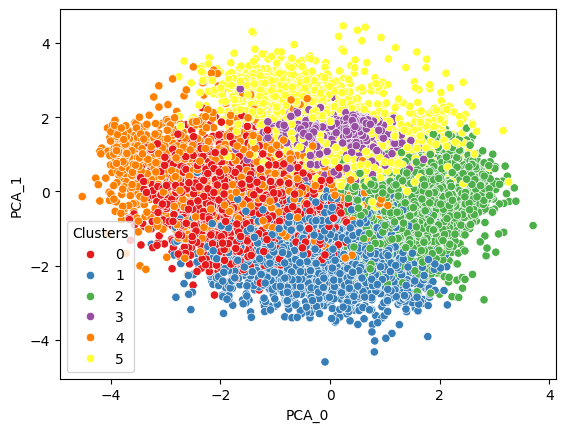

In [200]:

from sklearn.decomposition import PCA
pca=PCA(n_components=2,random_state=42)
pca_axes=pca.fit_transform(clusters_1_train.drop('Clusters',axis=1))
clusters_1_train_pca=clusters_1_train.copy()
clusters_1_train_pca['PCA_0']=pca_axes[:,0]
clusters_1_train_pca['PCA_1']=pca_axes[:,1]
sns.scatterplot(data=clusters_1_train_pca,x='PCA_0',y='PCA_1',hue='Clusters',marker='o',palette='Set1')

In [2]:
#fig,axes=plt.subplots(nrows=3,ncols=2,figsize=(20,10))
#axes=axes.flatten()
colors=['red','black','green','yellow','blue','purple']
for i in range(0,6):
    new_data=clusters_1_train_pca.copy()
    new_data=new_data[new_data['Clusters']==i]
    sns.scatterplot(data=new_data,x='PCA_0',y='PCA_1',marker='o',ax=axes[i],color=colors[i])
    axes[i].set_xlim(-4,4)
    axes[i].set_ylim(-4,4)
    axes[i].axhline(new_data['PCA_1'].max(),linestyle='--',color='grey')
    axes[i].axhline(new_data['PCA_1'].min(),linestyle='--',color='grey')
    axes[i].axvline(new_data['PCA_0'].max(),linestyle='--',color='grey')
    axes[i].axvline(new_data['PCA_0'].min(),linestyle='--',color='grey')
    axes[i].set_title(f'Cluster no.-{i}')
plt.tight_layout()

In [137]:
components=pca.components_
x=np.abs(list(components[0]))
sum_x=np.sum(np.abs(list(components[0])))
pca_1_perc=x/sum_x*100
y=np.abs(list(components[1]))
sum_y=np.sum(np.abs(list(components[1])))
pca_2_perc=y/sum_y*100
pca_components_weights_df=pd.DataFrame({'Features':clusters_1_train.drop('Clusters',axis=1).columns,'PCA_1_weights':list(components[0]),
                                        'PCA_2_weights':list(components[1]),'PCA_1_Percentage_contribution(%)':pca_1_perc,
                                        'PCA_2_Percentage_contribution(%)':pca_2_perc})
pca_components_weights_df

,Features,PCA_1_weights,PCA_2_weights,PCA_1_Percentage_contribution(%),PCA_2_Percentage_contribution(%)
0,num__Age,0.194660,0.506725,6.103258,15.851525
1,num__FCVC,0.124601,0.324850,3.906682,10.162060
2,num__NCP,0.230251,-0.154035,7.219168,4.818567
3,num__CH2O,0.375394,-0.024266,11.769891,0.759111
4,num__FAF,0.147912,-0.457894,4.637537,14.323970
5,num__TUE,-0.073947,-0.420677,2.318506,13.159739
6,num__Height,0.545877,-0.313826,17.115126,9.817183
7,num__Weight,0.569905,0.231926,17.868476,7.255166
8,non_ord__MTRANS_Automobile,0.036350,0.085585,1.139707,2.677289
9,non_ord__MTRANS_Bike,0.000144,-0.000662,0.004515,0.020724


___**PCA Visualization**___

Principal Component Analysis (PCA) is a linear dimensionality reduction method that aims to capture the maximum variance in the dataset by assuming linear relationships between features. For optimal performance of machine learning models, it is important that data points are well-distinguished from one another.

**Analysis:**

By visualizing the scatterplot of the two PCA dimensions, the following observations can be made:

- **Clustering and Overlap**: The data points in the scatterplot tend to cluster together with some degree of overlap. This indicates that PCA has not fully separated the underlying structures with linear projections alone.

- **Dimensionality Limitation**: The significant overlap among clusters suggests that the data might be too complex to be captured effectively with just two principal components. This limitation points to the fact that linear projections may not always suffice to reveal complex patterns in the data.

- **Complex Data**: If clusters are not well-separated in the PCA visualization, it implies that the inherent complexity of the data might not be easily represented in a 2D plane.

These insights suggest that while PCA is useful for reducing dimensionality, it may not always capture the complexities of the dataset, especially when linear relationships are insufficient to reveal the underlying structure.


*Visualizing a scatterplot representing two tsne based dimensions and using hue as clusters*

<Axes: xlabel='TSNE_0', ylabel='TSNE_1'>

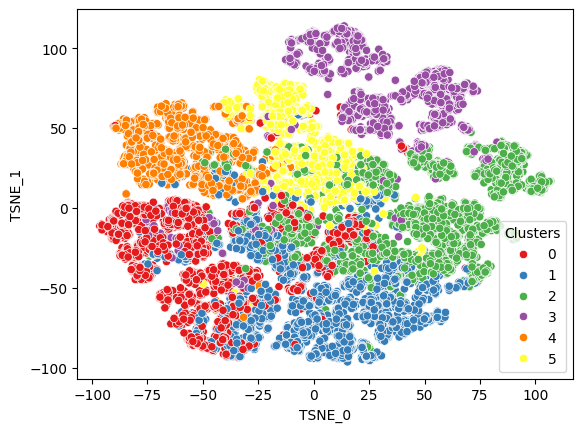

In [62]:

from sklearn.manifold import TSNE

tsne=TSNE(n_components=2,random_state=42)
tsne_axes=tsne.fit_transform(clusters_1_train.drop('Clusters',axis=1))

clusters_1_train_tsne=clusters_1_train.copy()
clusters_1_train_tsne['TSNE_0']=tsne_axes[:,0]
clusters_1_train_tsne['TSNE_1']=tsne_axes[:,1]

sns.scatterplot(data=clusters_1_train_tsne,x='TSNE_0',y='TSNE_1',hue='Clusters',marker='o',palette='Set1')

In [3]:
fig,axes=plt.subplots(nrows=3,ncols=2,figsize=(10,10))
axes=axes.flatten()
colors=['red','black','green','yellow','blue','purple']
for i in range(0,6):
    new_data=clusters_1_train_tsne.copy()
    new_data=new_data[new_data['Clusters']==i]
    sns.scatterplot(data=new_data,x='TSNE_0',y='TSNE_1',marker='o',ax=axes[i],color=colors[i])
    axes[i].set_xlim(-120,120)
    axes[i].set_ylim(-120,120)
    axes[i].axhline(new_data['TSNE_1'].max(),linestyle='--',color='grey')
    axes[i].axhline(new_data['TSNE_1'].min(),linestyle='--',color='grey')
    axes[i].axvline(new_data['TSNE_0'].max(),linestyle='--',color='grey')
    axes[i].axvline(new_data['TSNE_0'].min(),linestyle='--',color='grey')
    axes[i].set_title(f'Cluster no.-{i}')
plt.tight_layout()

___**t-SNE Visualization**___

t-Distributed Stochastic Neighbor Embedding (t-SNE) is a non-linear dimensionality reduction technique designed to preserve local structures and form clusters in lower-dimensional space. It is particularly effective for capturing complex relationships between data points.

**Inference:**

- **Overlap and Clustering**: The scatterplot shows visible overlap between data points characterized by `TSNE_0` and `TSNE_1`, but also reveals significant clustering in certain regions of the 2D space.

- **Preservation of Local Structure**: t-SNE's ability to preserve local structures is evident from the distinct clustering observed in the visualization. This suggests that t-SNE effectively captures underlying complex relationships between data points.

- **Complex Relationships**: The significant clustering indicates that t-SNE has successfully captured the non-linear relationships and structure within the data that may not be apparent with linear dimensionality reduction techniques like PCA.

Overall, the t-SNE visualization demonstrates the method's strength in revealing complex patterns and structures in the data, offering insights into the underlying relationships between data points.


*Running a sample model using cluster information as a feature*

In [74]:
model=xgb.XGBClassifier(random_state=42)
model.fit(clusters_1_train,y_train)
model.feature_importances_

array([0.01780807, 0.12564883, 0.02145319, 0.01880218, 0.0114902 ,
       0.01473617, 0.04064754, 0.23541978, 0.01229755, 0.0077316 ,
       0.        , 0.01308661, 0.00675996, 0.29857555, 0.        ,
       0.01877605, 0.        , 0.03678207, 0.        , 0.0075083 ,
       0.        , 0.02606027, 0.        , 0.01577778, 0.02676592,
       0.04387239], dtype=float32)

In [89]:
 model=xgb.XGBClassifier(random_state=42)
model.fit(clusters_1_train,y_train)
accuracy_score(y_test,model.predict(clusters_1_test))

0.9111402932808055

*Running xgb and lgb model using cluster information as a feature with cross validation*

In [100]:
from sklearn.model_selection import cross_val_score
cvs_accuracy=[]
model_names=[]

for model,model_name in [(xgb.XGBClassifier(random_state=42),'XGB_CLASSIFIER'),(lgb.LGBMClassifier(random_state=42),'LGBM_CLASSIFIER')]:
    cvs=cross_val_score(model,clusters_1_train,y_train,cv=cv,scoring='accuracy')
    cvs_accuracy.append(np.mean(cvs))
    model_names.append(model_name)
cluster_cvs=pd.DataFrame({'Model':model_names,'Accuracy':cvs_accuracy})

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008896 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2050
[LightGBM] [Info] Number of data points in the train set: 14620, number of used features: 26
[LightGBM] [Info] Start training from score -2.110282
[LightGBM] [Info] Start training from score -1.916923
[LightGBM] [Info] Start training from score -2.127357
[LightGBM] [Info] Start training from score -2.083554
[LightGBM] [Info] Start training from score -1.958229
[LightGBM] [Info] Start training from score -1.858654
[LightGBM] [Info] Start training from score -1.654916
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 204

In [106]:
cluster_cvs

,Model,Accuracy
0,XGB_CLASSIFIER,0.911524
1,LGBM_CLASSIFIER,0.911524


In [84]:
# xgb-preprocessing_1 (with cluster information) hyperparameter optimization (logloss) using hyperopt and cross_validation

from hyperopt import tpe,hp,fmin,Trials,STATUS_OK
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss, cohen_kappa_score
import xgboost as xgb
import numpy as np
import time


cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

space={
    'n_estimators':hp.quniform('n_estimators',400,700,1),
    'max_depth':hp.quniform('max_depth',4,18,2),
    #'min_child_weight':hp.quniform('min_child_weight',0,20,1),
    'learning_rate':hp.uniform('learning_rate',0.01,0.3),
    'colsample_bytree':hp.uniform('colsample_bytree',0.4,1),
    'subsample':hp.uniform('subsample',0.4,1),
    'reg_alpha':hp.uniform('reg_alpha',0,2.5),
    'reg_lambda':hp.uniform('reg_lambda',0,2.5)
}



def objective_fn(params):
    
    params['n_estimators']=int(params['n_estimators'])
    #params['min_child_weight']=int(params['min_child_weight'])
    params['max_depth']=int(params['max_depth'])
    params['objective']='multi:softprob'
    params['num_class']=7



    training_set=xgb.DMatrix(clusters_1_train,label=y_train)
    validation_set=xgb.DMatrix(clusters_1_test,label=y_test)

    evals_result={}
        
    params_1=params.copy()
    del params_1['n_estimators']
        
    model=xgb.train(params_1,dtrain=training_set,num_boost_round=params['n_estimators'],evals=[(training_set,'training_set'),(validation_set,'validation_set')],
                       early_stopping_rounds=50,evals_result=evals_result,verbose_eval=False)

    y_predict_prob=model.predict(validation_set,iteration_range=(0,model.best_iteration))
    y_predict=np.argmax(y_predict_prob,axis=1)
        
    score=accuracy_score(y_test,y_predict)


    return {'loss': -score, 'status': STATUS_OK}

trials=Trials()
best_clusters=fmin(fn=objective_fn,trials=trials,algo=tpe.suggest,max_evals=150,rstate=np.random.default_rng(42),space=space)
print('The best hyperparameters found for the dataset based on logloss is:', best_clusters) 


100%|█████████████████████████████████████████████| 150/150 [19:45<00:00,  7.90s/trial, best loss: -0.9188006128255636]
The best hyperparameters found for the dataset based on logloss is: {'colsample_bytree': 0.4026398720158062, 'learning_rate': 0.035475476105302314, 'max_depth': 16.0, 'n_estimators': 522.0, 'reg_alpha': 2.2891217213313815, 'reg_lambda': 0.7347972098898532, 'subsample': 0.8586926966773896}


In [87]:
# lgb-preprocessing_1 (with cluster information) optuna optimization (accuracy) direct

import optuna
from sklearn.model_selection import StratifiedKFold
import lightgbm as lgb
import numpy as np
import time


cv=StratifiedKFold(n_splits=5,shuffle=True,random_state=42)


def objective_fn(trial):
    
    params={
        'n_estimators':trial.suggest_int('n_estimators',400,700),
        'max_depth':trial.suggest_int('max_depth',4,18),
        #'min_child_weight':trial.suggest_int('min_child_weight',0,20),
        'min_child_samples':trial.suggest_int('min_child_samples',10,100),
        'learning_rate':trial.suggest_float('learning_rate',0.01,0.3),
        'colsample_bytree':trial.suggest_float('colsample_bytree',0.4,1),
        'subsample':trial.suggest_float('subsample',0.4,1),
        'lambda_l1':trial.suggest_float('reg_alpha',0,2.5),
        'lambda_l2':trial.suggest_float('reg_lambda',0,2.5),
        'num_class':7,
        'objective':'multiclass',
        'early_stopping_rounds':50,
        'verbosity':-1
        
        
    }


    params_1=params.copy()
    del params_1['n_estimators']
        

    training_set=lgb.Dataset(clusters_1_train,label=y_train)
    validation_set=lgb.Dataset(clusters_1_test,label=y_test)

    model=lgb.train(params_1,training_set,params['n_estimators'],valid_sets=[training_set,validation_set])

    y_predict_prob=model.predict(clusters_1_test,num_iteration=model.best_iteration)
    y_predict=np.argmax(y_predict_prob,axis=1)
    score=accuracy_score(y_test,y_predict)

    return score
    
study_1=optuna.create_study(direction='maximize')
study_1.optimize(objective_fn,n_trials=150)
print('The best hyperparameters found for the dataset based on logloss is:', study_1.best_params) 

      
                        
        

[I 2024-08-10 00:44:58,019] A new study created in memory with name: no-name-0517d665-7810-4ff1-93a1-6b74855b02da
[I 2024-08-10 00:44:58,976] Trial 0 finished with value: 0.9117968920989276 and parameters: {'n_estimators': 644, 'max_depth': 9, 'min_child_samples': 27, 'learning_rate': 0.250009112535306, 'colsample_bytree': 0.8560767570677543, 'subsample': 0.5424301090398544, 'reg_alpha': 0.5900743481732005, 'reg_lambda': 0.48145747449473614}. Best is trial 0 with value: 0.9117968920989276.
[I 2024-08-10 00:45:01,056] Trial 1 finished with value: 0.9137666885532939 and parameters: {'n_estimators': 503, 'max_depth': 12, 'min_child_samples': 27, 'learning_rate': 0.07937799040807457, 'colsample_bytree': 0.8804778452045741, 'subsample': 0.7953792758999045, 'reg_alpha': 2.3481249885305737, 'reg_lambda': 0.1512380858818127}. Best is trial 1 with value: 0.9137666885532939.
[I 2024-08-10 00:45:03,445] Trial 2 finished with value: 0.9157364850076604 and parameters: {'n_estimators': 541, 'max_dep

The best hyperparameters found for the dataset based on logloss is: {'n_estimators': 596, 'max_depth': 7, 'min_child_samples': 52, 'learning_rate': 0.12368410486556503, 'colsample_bytree': 0.4750330033717445, 'subsample': 0.673650085761298, 'reg_alpha': 0.2779867489769655, 'reg_lambda': 0.6423992267528413}


**Global specific models**
- The models are trained using the entire dataset and their metrics are evaluated seperately for each cluster

In [109]:
from sklearn.model_selection import cross_val_score
cvs_accuracy=[]
model_names=[]
params_xgb={'colsample_bytree': 0.4026398720158062, 'learning_rate': 0.035475476105302314,
            'max_depth': 16, 'n_estimators': 522, 'reg_alpha': 2.2891217213313815, 'reg_lambda': 0.7347972098898532, 'subsample': 0.8586926966773896}
params_lgb={'n_estimators': 596, 'max_depth': 7, 'min_child_samples': 52, 'learning_rate': 0.12368410486556503,
            'colsample_bytree': 0.4750330033717445, 'subsample': 0.673650085761298, 'reg_alpha': 0.2779867489769655, 'reg_lambda': 0.6423992267528413}
for model,model_name in [(xgb.XGBClassifier(random_state=42,**params_xgb),'XGB_CLASSIFIER'),(lgb.LGBMClassifier(random_state=42,**params_lgb),'LGBM_CLASSIFIER')]:
    cvs=cross_val_score(model,clusters_1_train,y_train,cv=cv,scoring='accuracy')
    cvs_accuracy.append(np.mean(cvs))
    model_names.append(model_name)
cluster_cvs_tuned=pd.DataFrame({'Model':model_names,'Accuracy':cvs_accuracy})

In [110]:
cluster_cvs_tuned

,Model,Accuracy
0,XGB_CLASSIFIER,0.916229
1,LGBM_CLASSIFIER,0.907091


In [237]:
from sklearn.model_selection import cross_val_score
accuracy=[]
model_names=[]
predictions=[]
params_xgb={'colsample_bytree': 0.4026398720158062, 'learning_rate': 0.035475476105302314,
            'max_depth': 16, 'n_estimators': 522, 'reg_alpha': 2.2891217213313815, 'reg_lambda': 0.7347972098898532, 'subsample': 0.8586926966773896}
params_lgb={'n_estimators': 596, 'max_depth': 7, 'min_child_samples': 52, 'learning_rate': 0.12368410486556503,
            'colsample_bytree': 0.4750330033717445, 'subsample': 0.673650085761298, 'reg_alpha': 0.2779867489769655, 'reg_lambda': 0.6423992267528413}
for model,model_name in [(xgb.XGBClassifier(random_state=42,**params_xgb),'XGB_CLASSIFIER'),(lgb.LGBMClassifier(random_state=42,**params_lgb),'LGBM_CLASSIFIER')]:
    model.fit(clusters_1_train,y_train)
    y_predict=model.predict(clusters_1_test)
    predictions.append(y_predict)
    accuracy.append(accuracy_score(y_test,y_predict))
    model_names.append(model_name)
cluster_tuned=pd.DataFrame({'Model':model_names,'Accuracy':accuracy})

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2046
[LightGBM] [Info] Number of data points in the train set: 18276, number of used features: 24
[LightGBM] [Info] Start training from score -2.109885
[LightGBM] [Info] Start training from score -1.917163
[LightGBM] [Info] Start training from score -2.127182
[LightGBM] [Info] Start training from score -2.083169
[LightGBM] [Info] Start training from score -1.958187
[LightGBM] [Info] Start training from score -1.858972
[LightGBM] [Info] Start training from score -1.655114
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

In [113]:
cluster_tuned

,Model,Accuracy
0,XGB_CLASSIFIER,0.914423
1,LGBM_CLASSIFIER,0.909389


In [266]:
accuracyscore=[]
cohenscore=[]
cluster_no=[]
for i in range(0,6):
    cluster_no.append(i)
    indexes=clusters_1_test[clusters_1_test['Clusters']==i].index
    accuracyscore.append(accuracy_score(y_test[clusters_1_test[clusters_1_test['Clusters']==i].index],predictions[0][indexes]))
    cohenscore.append(cohen_kappa_score(y_test[clusters_1_test[clusters_1_test['Clusters']==i].index],predictions[0][indexes],weights='quadratic'))

cluster_based_xgb=pd.DataFrame({'Cluster_No.':cluster_no,'Accuracy':accuracyscore,'Cohen':cohenscore})

In [267]:
cluster_based_xgb

,Cluster_No.,Accuracy,Cohen
0,0,0.892571,0.944418
1,1,0.893504,0.971797
2,2,0.952162,0.983298
3,3,0.980273,0.984466
4,4,0.894000,0.955066
5,5,0.844794,0.891391


In [268]:
accuracyscore=[]
cohenscore=[]
cluster_no=[]
for i in range(0,6):
    cluster_no.append(i)
    indexes=clusters_1_test[clusters_1_test['Clusters']==i].index
    accuracyscore.append(accuracy_score(y_test[clusters_1_test[clusters_1_test['Clusters']==i].index],predictions[1][indexes]))
    cohenscore.append(cohen_kappa_score(y_test[clusters_1_test[clusters_1_test['Clusters']==i].index],predictions[1][indexes],weights='quadratic'))

cluster_based_lgb=pd.DataFrame({'Cluster_No.':cluster_no,'Accuracy':accuracyscore,'Cohen':cohenscore})

In [269]:
cluster_based_lgb

,Cluster_No.,Accuracy,Cohen
0,0,0.894857,0.936074
1,1,0.887114,0.967862
2,2,0.947562,0.982837
3,3,0.978756,0.981920
4,4,0.872000,0.943989
5,5,0.840864,0.892876


**Cluster specific models**
- The models are trained for individual datasets characterised by each cluster and their metrics are evaluated seperately.

In [190]:
xgb_clusters_set_train=[clusters_1_train_0,clusters_1_train_1,clusters_1_train_2,clusters_1_train_3,clusters_1_train_4,clusters_1_train_5]
xgb_clusters_set_train_y=[clusters_1_train_0_y,clusters_1_train_1_y,clusters_1_train_2_y,clusters_1_train_3_y,clusters_1_train_4_y,clusters_1_train_5_y]
xgb_clusters_set_test=[clusters_1_test_0,clusters_1_test_1,clusters_1_test_2,clusters_1_test_3,clusters_1_test_4,clusters_1_test_5]
xgb_clusters_set_test_y=[clusters_1_test_0_y,clusters_1_test_1_y,clusters_1_test_2_y,clusters_1_test_3_y,clusters_1_test_4_y,clusters_1_test_5_y]

In [191]:
lgb_clusters_set_train=[clusters_1_train_0,clusters_1_train_1,clusters_1_train_2,clusters_1_train_3,clusters_1_train_4,clusters_1_train_5]
lgb_clusters_set_train_y=[clusters_1_train_0_y,clusters_1_train_1_y,clusters_1_train_2_y,clusters_1_train_3_y,clusters_1_train_4_y,clusters_1_train_5_y]
lgb_clusters_set_test=[clusters_1_test_0,clusters_1_test_1,clusters_1_test_2,clusters_1_test_3,clusters_1_test_4,clusters_1_test_5]
lgb_clusters_set_test_y=[clusters_1_test_0_y,clusters_1_test_1_y,clusters_1_test_2_y,clusters_1_test_3_y,clusters_1_test_4_y,clusters_1_test_5_y]

In [233]:
# Validation- clusters xgb for preprocessed_1 data
import lightgbm as lgb
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import cohen_kappa_score,accuracy_score,classification_report,log_loss


cluster_no=[]
accuracyscore=[]
cohenscore=[]
classification_report_xgb=[]
fi_clusters_xgb=pd.DataFrame()

model=xgb.XGBClassifier(random_state=42,**params_xgb,num_class=7,objective='multi:softmax')

for i in range(0,6):
    cluster_no.append(i)
    model.fit(xgb_clusters_set_train[i],xgb_clusters_set_train_y[i])

    cluster_feature_imp=pd.DataFrame()
    cluster_feature_imp['Importance']=model.feature_importances_
    cluster_feature_imp['Features']=lgb_clusters_set_train[i].columns
    cluster_feature_imp['Cluster_no.']=i
    fi_clusters_xgb=pd.concat([fi_clusters_xgb,cluster_feature_imp],axis=0)

    
    y_predict=model.predict(xgb_clusters_set_test[i])

    accuracyscore.append(accuracy_score(xgb_clusters_set_test_y[i],y_predict))
    cohenscore.append(cohen_kappa_score(xgb_clusters_set_test_y[i],y_predict,weights='quadratic'))
    classification_report_xgb.append(classification_report(xgb_clusters_set_test_y[i],y_predict,zero_division=0))
XGB_preprocessing_1_clusters=pd.DataFrame({'Cluster_No.':cluster_no,'Accuracy':accuracyscore,'Cohen':cohenscore})


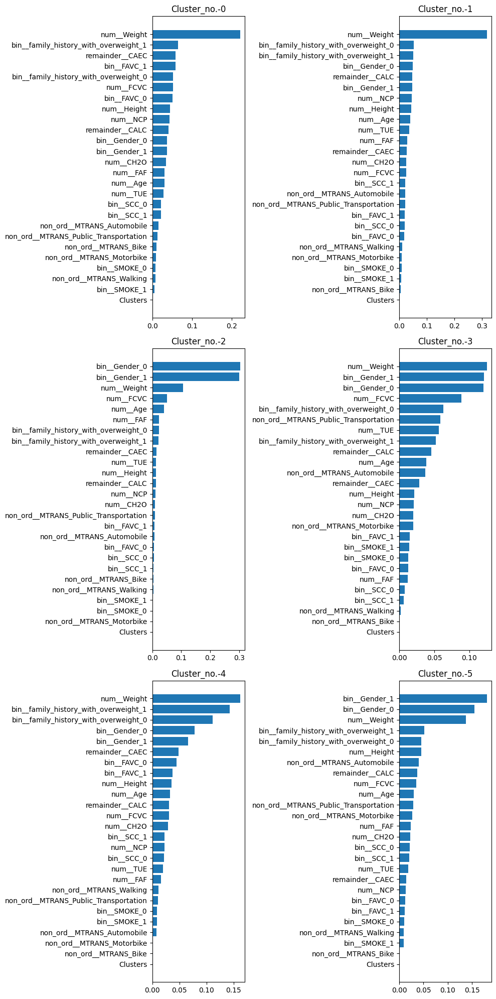

In [234]:
fig,axes=plt.subplots(nrows=3,ncols=2,figsize=(10,20))
axes=axes.flatten()
for i in range(0,6):
    fi_df=fi_clusters_xgb[fi_clusters_xgb['Cluster_no.']==i]
    fi_df=fi_df.drop(['Cluster_no.'],axis=1)
    fi_df=fi_df.sort_values(by='Importance',ascending=False)
    axes[i].barh(fi_df['Features'],fi_df['Importance'])
    axes[i].invert_yaxis()
    axes[i].set_title(f'Cluster_no.-{i}')

plt.tight_layout()
    

In [235]:
# Validation- clusters lgb for preprocessed_1 data
import lightgbm as lgb
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import cohen_kappa_score,accuracy_score,classification_report,log_loss


cluster_no=[]
accuracyscore=[]
cohenscore=[]
classification_report_lgb=[]

fi_clusters_lgb=pd.DataFrame()

model=lgb.LGBMClassifier(random_state=42,**params_xgb)

for i in range(0,6):
    
    cluster_no.append(i)
    model.fit(lgb_clusters_set_train[i],lgb_clusters_set_train_y[i])
    
    cluster_feature_imp=pd.DataFrame()
    cluster_feature_imp['Importance']=model.feature_importances_
    cluster_feature_imp['Features']=lgb_clusters_set_train[i].columns
    cluster_feature_imp['Cluster_no.']=i
    fi_clusters_lgb=pd.concat([fi_clusters_lgb,cluster_feature_imp],axis=0)
    
    y_predict=model.predict(lgb_clusters_set_test[i])
    accuracyscore.append(accuracy_score(lgb_clusters_set_test_y[i],y_predict))
    cohenscore.append(cohen_kappa_score(lgb_clusters_set_test_y[i],y_predict,weights='quadratic'))
    classification_report_lgb.append(classification_report(lgb_clusters_set_test_y[i],y_predict,zero_division=0))
LGB_preprocessing_1_clusters=pd.DataFrame({'Cluster_No.':cluster_no,'Accuracy':accuracyscore,'Cohen':cohenscore})


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1865
[LightGBM] [Info] Number of data points in the train set: 3331, number of used features: 23
[LightGBM] [Info] Start training from score -1.247224
[LightGBM] [Info] Start training from score -0.865373
[LightGBM] [Info] Start training from score -1.906470
[LightGBM] [Info] Start training from score -2.609770
[LightGBM] [Info] Start training from score -2.817723
[LightGBM] [Info] Start training from score -5.338439
[LightGBM] [Info] Start training from score -5.277814
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

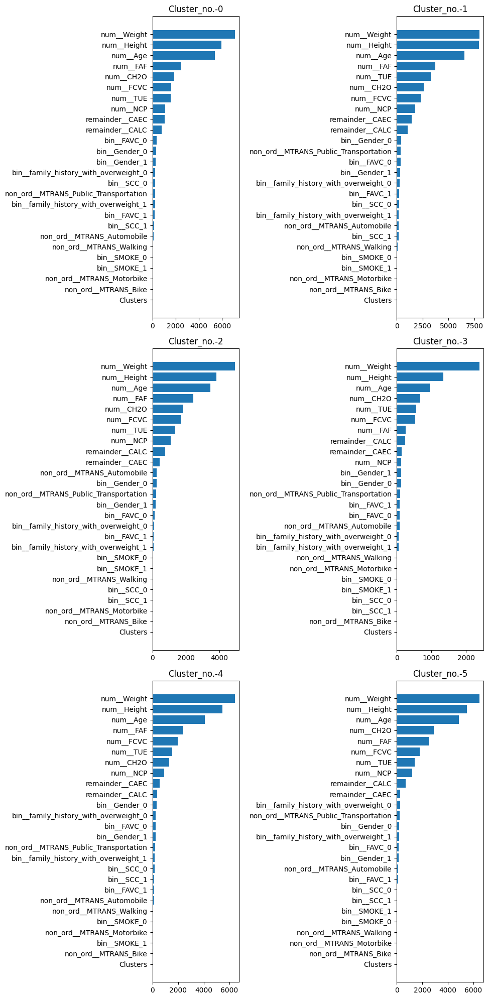

In [236]:
fig,axes=plt.subplots(nrows=3,ncols=2,figsize=(10,20))
axes=axes.flatten()
for i in range(0,6):
    fi_df=fi_clusters_lgb[fi_clusters_lgb['Cluster_no.']==i]
    fi_df=fi_df.drop(['Cluster_no.'],axis=1)
    fi_df=fi_df.sort_values(by='Importance',ascending=False)
    axes[i].barh(fi_df['Features'],fi_df['Importance'])
    axes[i].invert_yaxis()
    axes[i].set_title(f'Cluster_no.-{i}')

plt.tight_layout()
    

In [201]:
XGB_preprocessing_1_clusters

,Cluster_No.,Accuracy,Cohen
0,0,0.889143,0.942277
1,1,0.886049,0.969569
2,2,0.948482,0.983006
3,3,0.972686,0.979024
4,4,0.874000,0.944624
5,5,0.836935,0.894921


In [200]:
LGB_preprocessing_1_clusters

,Cluster_No.,Accuracy,Cohen
0,0,0.891429,0.941936
1,1,0.889244,0.968566
2,2,0.946642,0.981237
3,3,0.969651,0.979276
4,4,0.866000,0.943315
5,5,0.834971,0.890986


In [ ]:
# cluster specific modelling using cross vlaidation

In [205]:
# Validation- clusters xgb for preprocessed_1 data
import lightgbm as lgb
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import cohen_kappa_score,accuracy_score,classification_report,log_loss,make_scorer

cohen_kappa=make_scorer(cohen_kappa_score,weights='quadratic')

cluster_no=[]
accuracyscore=[]
cohenscore=[]
classification_report_xgb=[]

model=xgb.XGBClassifier(random_state=42,**params_xgb,num_class=7,objective='multi:softmax')

for i in range(0,6):
    cluster_no.append(i)
    acc_cvs=cross_val_score(model,xgb_clusters_set_train[i],xgb_clusters_set_train_y[i],scoring='accuracy',cv=cv)
    ck_cvs=cross_val_score(model,xgb_clusters_set_train[i],xgb_clusters_set_train_y[i],scoring=cohen_kappa,cv=cv)

    accuracyscore.append(np.mean(acc_cvs))
    cohenscore.append(np.mean(ck_cvs))
XGB_preprocessing_1_clusters_cvs=pd.DataFrame({'Cluster_No.':cluster_no,'Accuracy':accuracyscore,'Cohen':cohenscore})


In [ ]:
# Validation- clusters lgb for preprocessed_1 data
import lightgbm as lgb
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import cohen_kappa_score,accuracy_score,classification_report,log_loss


cluster_no=[]
accuracyscore=[]
cohenscore=[]
classification_report_lgb=[]

model=lgb.LGBMClassifier(random_state=42,**params_xgb)

for i in range(0,6):
    cluster_no.append(i)
    acc_cvs=cross_val_score(model,lgb_clusters_set_train[i],lgb_clusters_set_train_y[i],scoring='accuracy',cv=cv)
    ck_cvs=cross_val_score(model,lgb_clusters_set_train[i],lgb_clusters_set_train_y[i],scoring=cohen_kappa,cv=cv)

    accuracyscore.append(np.mean(acc_cvs))
    cohenscore.append(np.mean(ck_cvs))
LGB_preprocessing_1_clusters_cvs=pd.DataFrame({'Cluster_No.':cluster_no,'Accuracy':accuracyscore,'Cohen':cohenscore})


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1715
[LightGBM] [Info] Number of data points in the train set: 2664, number of used features: 23
[LightGBM] [Info] Start training from score -1.246402
[LightGBM] [Info] Start training from score -0.865608
[LightGBM] [Info] Start training from score -1.906170
[LightGBM] [Info] Start training from score -2.609469
[LightGBM] [Info] Start training from score -2.818680
[LightGBM] [Info] Start training from score -5.322635
[LightGBM] [Info] Start training from score -5.322635
[LightGBM]

In [206]:
XGB_preprocessing_1_clusters_cvs

,Cluster_No.,Accuracy,Cohen
0,0,0.884725,0.935036
1,1,0.881741,0.965110
2,2,0.945800,0.979661
3,3,0.974042,0.975511
4,4,0.850831,0.952523
5,5,0.860582,0.912686


In [209]:
LGB_preprocessing_1_clusters_cvs

,Cluster_No.,Accuracy,Cohen
0,0,0.884123,0.934252
1,1,0.876474,0.964388
2,2,0.946974,0.979698
3,3,0.971785,0.974386
4,4,0.847506,0.951290
5,5,0.862938,0.912959


In [279]:
Comparison_df_XGB=pd.DataFrame({'Cluster_no.':XGB_preprocessing_1_clusters['Cluster_No.'],
                           'Global_Model_Accuracy':cluster_based_xgb['Accuracy'],
                            'Cluster_specific_Model_Accuracy':XGB_preprocessing_1_clusters['Accuracy'],
                           'Global_Model_Cohen_Score':cluster_based_xgb['Cohen'],'Cluster_specific_Model_Cohen_Score':XGB_preprocessing_1_clusters['Cohen']})

Comparison_df_LGB=pd.DataFrame({'Cluster_no.':LGB_preprocessing_1_clusters['Cluster_No.'],
                           'Global_Model_Accuracy':cluster_based_lgb['Accuracy'],
                            'Cluster_specific_Model_Accuracy':LGB_preprocessing_1_clusters['Accuracy'],
                           'Global_Model_Cohen_Score':cluster_based_lgb['Cohen'],'Cluster_specific_Model_Cohen_Score':LGB_preprocessing_1_clusters['Cohen']})

In [278]:
Comparison_df_XGB

,Cluster_no.,Global_Model_Accuracy,Cluster_specific_Model_Accuracy,Global_Model_Cohen_Score,Cluster_specific_Model_Cohen_Score
0,0,0.892571,0.889143,0.944418,0.942277
1,1,0.893504,0.886049,0.971797,0.969569
2,2,0.952162,0.948482,0.983298,0.983006
3,3,0.980273,0.972686,0.984466,0.979024
4,4,0.894000,0.874000,0.955066,0.944624
5,5,0.844794,0.836935,0.891391,0.894921


In [280]:
Comparison_df_LGB

,Cluster_no.,Global_Model_Accuracy,Cluster_specific_Model_Accuracy,Global_Model_Cohen_Score,Cluster_specific_Model_Cohen_Score
0,0,0.894857,0.891429,0.936074,0.941936
1,1,0.887114,0.889244,0.967862,0.968566
2,2,0.947562,0.946642,0.982837,0.981237
3,3,0.978756,0.969651,0.981920,0.979276
4,4,0.872000,0.866000,0.943989,0.943315
5,5,0.840864,0.834971,0.892876,0.890986


### **Inference**

The global model generally performs slightly better in accuracy and Cohen's kappa across most clusters, with the exception of Cluster 5, where the cluster-specific model outperforms it. This suggests that while the global model provides consistent and strong predictive power across the dataset, specialized models might be beneficial for certain clusters with unique characteristics. A hybrid approach could be considered, using the global model for the majority of clusters and cluster-specific models for challenging clusters like Cluster 5.


### **<u>Understanding feature impact usign feature selection<u>**

In [119]:
data_org['BMI']=data_org['Weight']/(data_org['Height'])**2
data_org['BMI_bin']=pd.cut(data_org['BMI'],bins=[(data['BMI'].min()-1),18.5,25,30,35,40,45,(data['BMI'].max()+1)],
                       labels=['Insufficient_Weight','Normal_Weight', 'Overweight_Level_I','Overweight_Level_II',
                              'Obesity_Type_I','Obesity_Type_II','Obesity_Type_III'])
data_org['Health']=data_org['BMI_bin'].apply(lambda x: 'Obese' if x in ['Overweight_Level_II','Obesity_Type_III', 'Obesity_Type_II', 'Overweight_Level_I',
       'Obesity_Type_I'] else 'UnderWeight' if x=='Insufficient_Weight' else 'Healthy')
data_org.drop_duplicates(inplace=True)
data_m=pd.concat([data,data_org],axis=0)
data_model=data_m.drop(['Health','BMI_bin','NObeyesdad_en'],axis=1)


In [120]:
#data_model=data_model.drop(['Health','BMI_bin'],axis=1)
# identifying potential ordinal and nonordinal categorical variables
bin=[]
for i in data_model.columns:
    if data_model[i].dtype=='object':
        if data_model[i].nunique()==2:
            bin.append(i)
        else:
            print(i,'--------',data_m[i].nunique())
            print('------------------------------------')
            print('values--','\n',data_m[i].unique(),'\n\n')

CAEC -------- 4
------------------------------------
values-- 
 ['Sometimes' 'Frequently' 'no' 'Always'] 


CALC -------- 4
------------------------------------
values-- 
 ['Sometimes' 'no' 'Frequently' 'Always'] 


MTRANS -------- 5
------------------------------------
values-- 
 ['Public_Transportation' 'Automobile' 'Walking' 'Motorbike' 'Bike'] 


NObeyesdad -------- 7
------------------------------------
values-- 
 ['Overweight_Level_II' 'Normal_Weight' 'Insufficient_Weight'
 'Obesity_Type_III' 'Obesity_Type_II' 'Overweight_Level_I'
 'Obesity_Type_I'] 




In [121]:
bin_data=data_model[bin]
ordinal_data=data_model[['CAEC','CALC']]
non_ord_data=data[['MTRANS']]
target_data=data_model[['NObeyesdad']]
num_data=data[['Age', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE','Height','Weight','BMI']]
data_model['NObeyesdad']=data_model['NObeyesdad'].replace({'Overweight_Level_II':3, 'Normal_Weight':1, 'Insufficient_Weight':0,
       'Obesity_Type_III':6, 'Obesity_Type_II':5, 'Overweight_Level_I':2,
       'Obesity_Type_I':4})   
X=data_model.drop(['NObeyesdad'],axis=1)
y=data_model['NObeyesdad']


In [122]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)


In [123]:
# preprocesing_1
#ordinal_encoding
from sklearn.preprocessing import OrdinalEncoder
encoder=OrdinalEncoder()
X_train_1=X_train.copy()
X_test_1=X_test.copy()
X_train_1[ordinal_data.columns]=encoder.fit_transform(X_train[ordinal_data.columns])
X_test_1[ordinal_data.columns]=encoder.transform(X_test[ordinal_data.columns])

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from category_encoders import BinaryEncoder
numerical_transformer=Pipeline(steps=[('scaler',StandardScaler())])
non_ordinal_transformer=Pipeline(steps=[('encoder',OneHotEncoder(handle_unknown='ignore'))])
bin_transformer=Pipeline(steps=[('encoder',BinaryEncoder(handle_unknown='ignore'))])
preprocessor_1=ColumnTransformer(transformers=[('num',numerical_transformer,num_data.columns),
                                            ('non_ord',non_ordinal_transformer,non_ord_data.columns),
                                              ('bin',bin_transformer,bin_data.columns)],
                              remainder='passthrough')
pipeline_1=Pipeline(steps=[('preprocessor_1',preprocessor_1)])

X_train_1=pd.DataFrame(pipeline_1.fit_transform(X_train_1),index=X_train.index,columns=pipeline_1.named_steps['preprocessor_1'].get_feature_names_out())
X_test_1=pd.DataFrame(pipeline_1.transform(X_test_1),index=X_test.index,columns=pipeline_1.named_steps['preprocessor_1'].get_feature_names_out())

In [124]:
# preprocessing_2 GET DUMMIES
all_cat_data=data[((non_ord_data.columns).append(bin_data.columns)).append(ordinal_data.columns)]

from sklearn.preprocessing import StandardScaler
X_train_2=X_train.copy()
X_test_2=X_test.copy()

# scaling
X_train_2[num_data.columns]=scaler.fit_transform(X_train_2[num_data.columns])
X_test_2[num_data.columns]=scaler.transform(X_test_2[num_data.columns])

X_train_2=pd.DataFrame(X_train_2,index=X_train.index,columns=X_train_2.columns)
X_test_2=pd.DataFrame(X_test_2,index=X_test.index,columns=X_test_2.columns)


X_temp=pd.concat([X_train_2,X_test_2],axis=0,keys=['train','test'])
X_temp=pd.get_dummies(X_temp,columns=all_cat_data.columns)
X_train_2=X_temp.xs('train')
X_test_2=X_temp.xs('test')

In [125]:
# preprocessing_3 target encoding
all_cat_data=data[((non_ord_data.columns).append(bin_data.columns)).append(ordinal_data.columns)]
from category_encoders import TargetEncoder
from sklearn.preprocessing import StandardScaler
X_train_3=X_train.copy()
X_test_3=X_test.copy()
scaler=StandardScaler()
encoder=TargetEncoder(cols=all_cat_data.columns,smoothing=0.3)

# scaling
X_train_3[num_data.columns]=scaler.fit_transform(X_train_3[num_data.columns])
X_test_3[num_data.columns]=scaler.transform(X_test_3[num_data.columns])

# encoding
X_train_3[all_cat_data.columns]=encoder.fit_transform(X_train_3[all_cat_data.columns],y_train)
X_test_3[all_cat_data.columns]=encoder.transform(X_test_3[all_cat_data.columns])

X_train_3=pd.DataFrame(X_train_3,index=X_train.index,columns=X_train_3.columns)
X_test_3=pd.DataFrame(X_test_3,index=X_test.index,columns=X_test_3.columns)

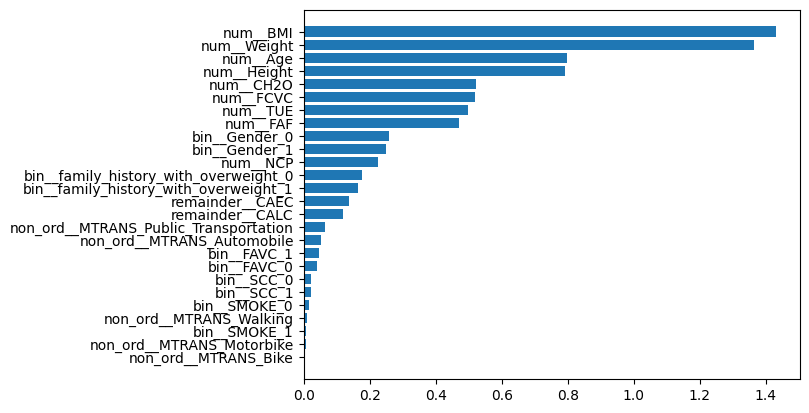

In [130]:
from sklearn.feature_selection import SelectKBest,mutual_info_classif

fs_1=SelectKBest(score_func=mutual_info_classif,k='all')
fs_1.fit(X_train_1,y_train)
X_train_fs_1=fs_1.transform(X_train_1)
X_test_fs_1=fs_1.transform(X_test_1)

fs_df=pd.DataFrame({'Columns':X_train_1.columns,'Imp':fs_1.scores_})
fs_df=fs_df.sort_values(by='Imp',ascending=False)
plt.barh(fs_df['Columns'],fs_df['Imp'])
plt.gca().invert_yaxis()
plt.show()

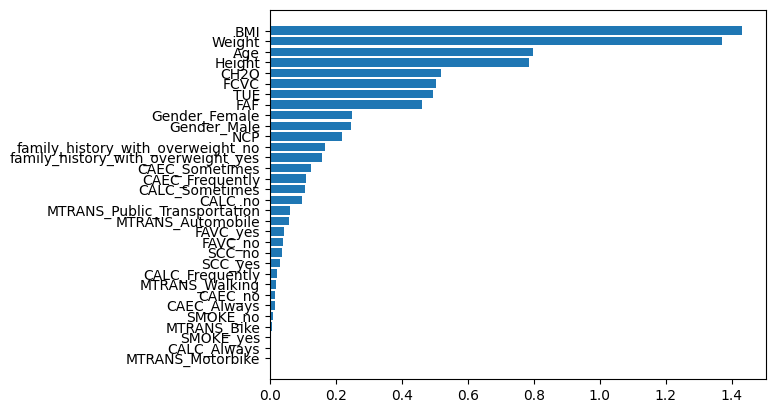

In [127]:
from sklearn.feature_selection import SelectKBest,mutual_info_classif

fs_2=SelectKBest(score_func=mutual_info_classif,k='all')
fs_2.fit(X_train_2,y_train)
X_train_fs_2=fs_2.transform(X_train_2)
X_test_fs_2=fs_2.transform(X_test_2)

fs_df=pd.DataFrame({'Columns':X_train_2.columns,'Imp':fs_2.scores_})
fs_df=fs_df.sort_values(by='Imp',ascending=False)
plt.barh(fs_df['Columns'],fs_df['Imp'])
plt.gca().invert_yaxis()
plt.show()

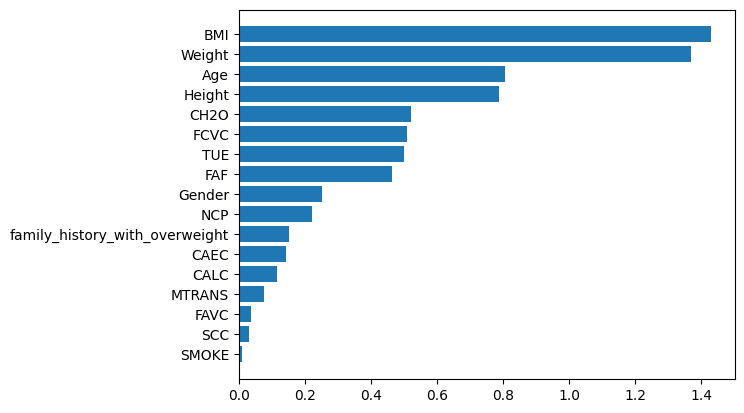

In [128]:
from sklearn.feature_selection import SelectKBest,mutual_info_classif

fs_3=SelectKBest(score_func=mutual_info_classif,k='all')
fs_3.fit(X_train_3,y_train)
X_train_fs_3=fs_3.transform(X_train_3)
X_test_fs_3=fs_3.transform(X_test_3)

fs_df=pd.DataFrame({'Columns':X_train_3.columns,'Imp':fs_3.scores_})
fs_df=fs_df.sort_values(by='Imp',ascending=False)
plt.barh(fs_df['Columns'],fs_df['Imp'])
plt.gca().invert_yaxis()
plt.show()

___**Weight, Age, Height, CH2O and FCVC appear to be the most important features in general based on fs evaluation**___

### *Best model based on Analysis*

In [16]:

import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold

params={'n_estimators': 417, 'max_depth': 7, 'learning_rate': 0.08000874397938304, 
        'colsample_bytree': 0.4800383182955504, 'subsample': 0.590135315806615, 'reg_alpha': 2.1743997172882716, 'reg_lambda': 2.001658609833063}

params['n_estimators']=int(params['n_estimators'])
#params['min_child_weight']=int(params['min_child_weight'])
#params['min_child_samples']=int(params['min_child_samples'])
params['max_depth']=int(params['max_depth'])

params_1=params.copy()
del params_1['n_estimators']
params_1['objective']='multiclass'
params_1['num_class']=7
params_1['early_stopping_rounds']=50
params_1['verbosity']=-1

    
training_set=lgb.Dataset(X_train_2,label=y_train)
validation_set=lgb.Dataset(X_test_2,label=y_test)

model=lgb.train(params_1,training_set,params['n_estimators'],
                   valid_sets=[training_set,validation_set])


y_predict_prob=model.predict(X_test_2,num_iteration=model.best_iteration)
y_predict=np.argmax(y_predict_prob,axis=1)

#print('Accuracy_score-:',accuracy_score(y_test,y_predict))
#print('Cohen_kappa_score-:',cohen_kappa_score(y_test,y_predict,weights='quadratic'))
#print('logloss-:',log_loss(y_test,y_predict_prob))
best_model_prediction=y_predict
# saving the predictions
df_predictions_final=pd.DataFrame({'TEST':y_test,'PREDICTED':best_model_prediction})
df_predictions_final.to_csv('obesity_predictions.csv')

- Accuracy_score-: 0.92
- cohen_kappa_score-: 0.9850904176654074
- logloss-: 0.24447626957497162